UKM
CM6
MPI
IPL
UKM
CM6
MPI
IPL
UKM
CM6
MPI
IPL


UKM
CM6
MPI
IPL


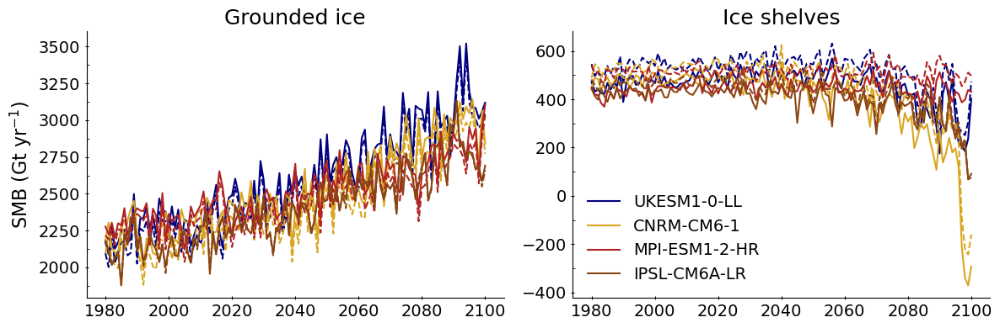

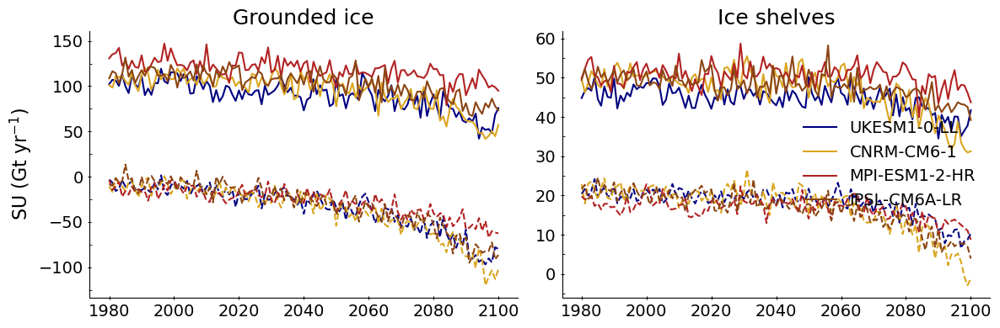

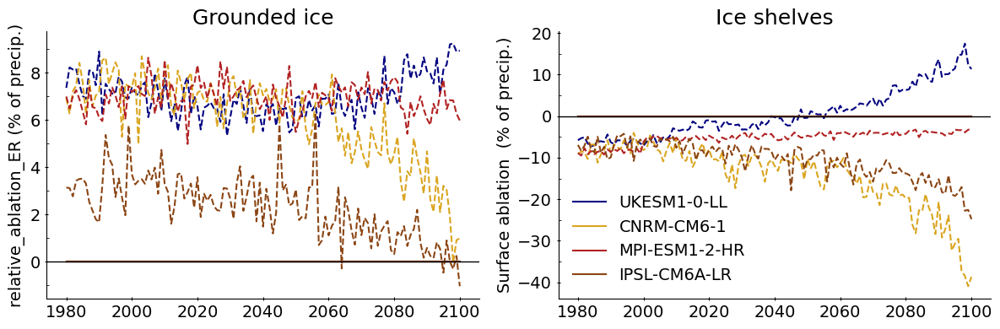

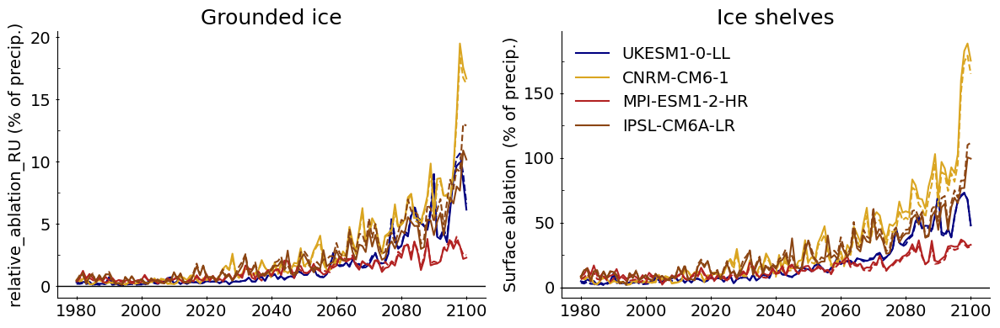

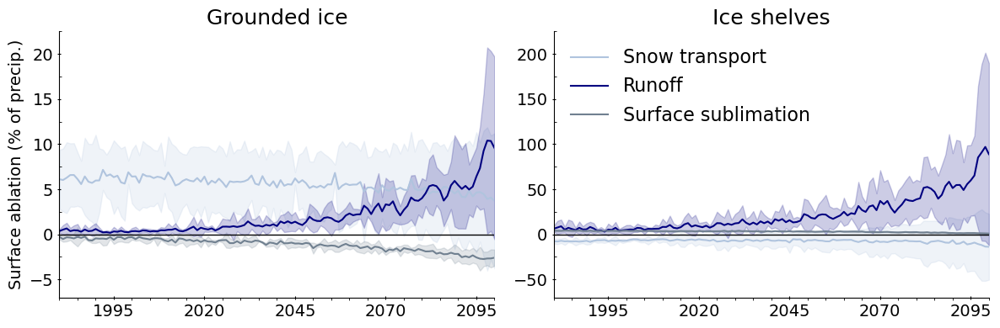

...

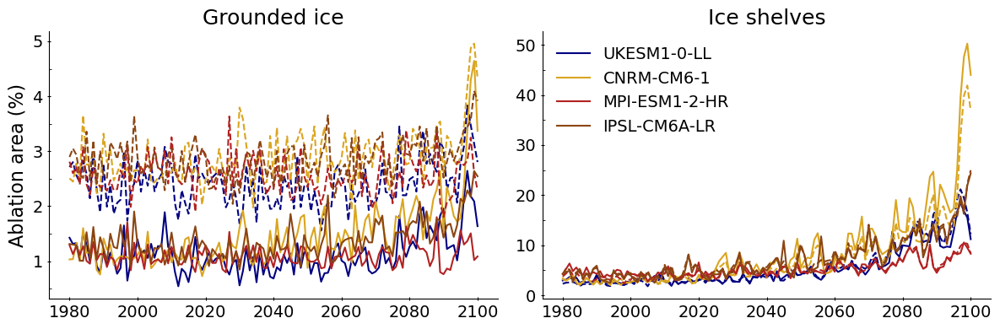

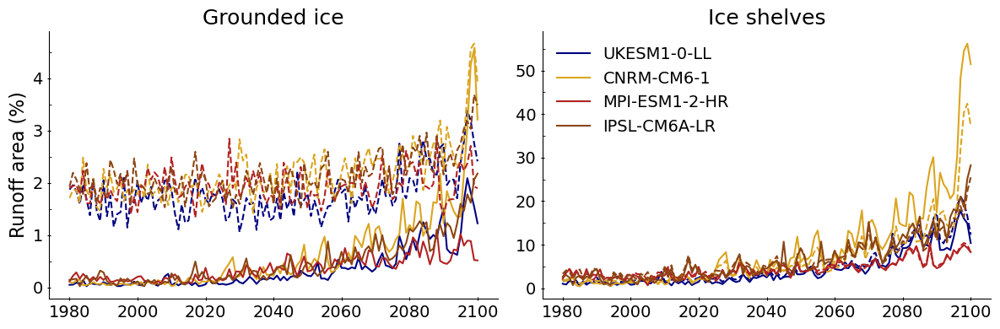

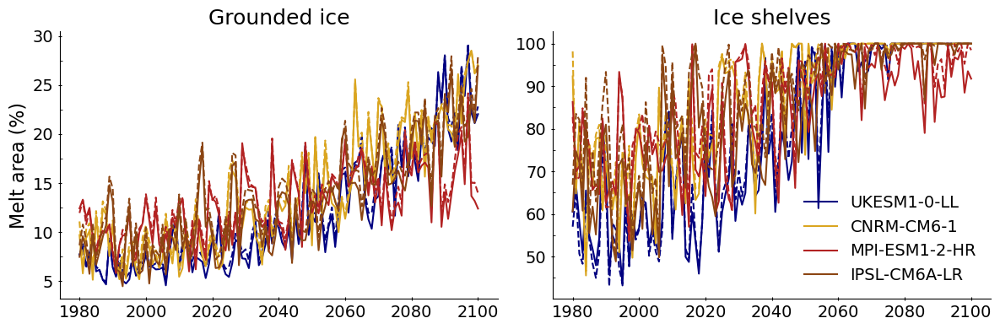

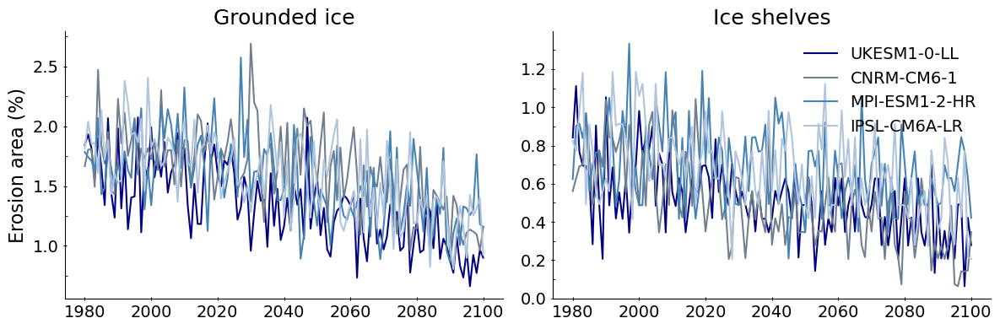

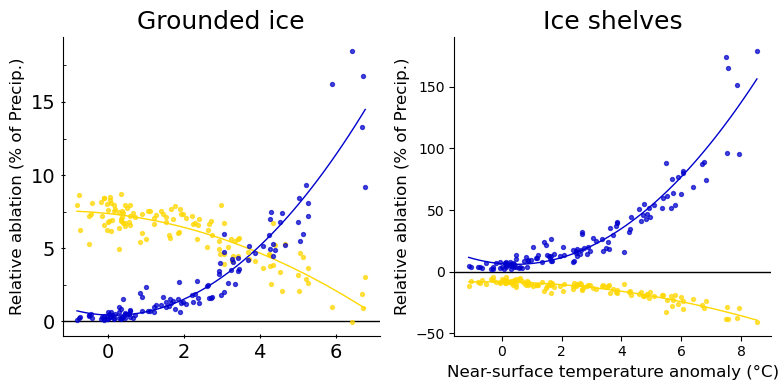

In [1]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import itertools

import numpy as np
import numpy.ma as ma # masked array
import xarray as xr
import matplotlib as mpl
import matplotlib.colors as colors
from matplotlib import pyplot as plt
from matplotlib import cm
from mpl_toolkits.axes_grid1 import make_axes_locatable
from matplotlib.legend_handler import HandlerLine2D
from matplotlib import ticker as mticker

#import plotlib as pls


import matplotlib.gridspec as gridspec


import shade2D as shade


plt.close('all')

# =============================================================================
# Definition of ICE MASK ; used color maps, 
# =============================================================================
MSK,ice,lsm,ground,shelf,x2D,y2D,sh,dh,rock,ice_msk,grd_msk = shade.ice_masking()

# =============================================================================
# 2. CREATE the ICE MASK 
# =============================================================================
test = xr.open_dataset('/Users/dashakan/Desktop/scripts_AIS/MARcst-AN35km-176x148.cdf2'
                       ,decode_times=False,engine="netcdf4")
#test=test.rename_dims({'x':'X', 'y':'Y'}) #change dim name
#Only AIS=1, other islands  =0
ais = test['AIS'].where(test['AIS'] >0) 
#Ice where ICE mask >= 30% (ICE[0-100%], dividing by 100 in the next ligne)
ice= test['ICE'].where(test['ICE']>30)  
#Combine ais + ice/100 * factor area for taking into account the projection deformation
ice_msk = (ais*ice*test['AREA']/ 100)    

#ground mask
grd=test['GROUND'].where (test['GROUND']>30)# & (test['SH']<1000) )
grd_msk = (ais*grd*test['AREA']/ 100)

#ice-shelf mask
shf=test['ICE'].where((test['ICE']>30) & (test['GROUND']<50) & (test['ROCK']<30))
shf_msk=(shf*test['AREA'])/100

rig=test['RIGNOT']
west=shf.where((rig==1) | (rig==2) | (rig==9) | (rig==14) | (rig==18)  | (rig==24) | (rig==24.5) | (rig==19) | (rig==19.5) |(rig==20) | (rig==20.5 ) )
west_msk=(west*test['AREA'])/100.

east=shf.where( (rig==3) | (rig==4) | (rig==5) | (rig==10) | (rig==12)  | (rig==23)  | (rig==23.5) | (rig==6) | (rig==7) | (rig==8) | (rig==11) | (rig==13)  | (rig==21) | (rig==22) | (rig==21.5) | (rig==22) )
east_msk=(east*test['AREA'])/100.

peni = shf.where((rig==15) | (rig==16) | (rig==17) | (rig==15) | (rig==25)  | (rig==25.5) | (rig==26) | (rig==26.5))
peni_msk=(peni*test['AREA'])/100.


cmap_seq, cmap_smb, cmap_div, cmap_qual, cmap_BuRd, obs_color, sh_color, cmap_Puor = shade.def_cmaps()

dpi=300

def preprocess(ds):
    '''
    Avoid reading/opening the whole ds. => Selection of interesting variable
    Also try to remove SECTOR dimension 
    (Sector=1 corresponds to the ice sheet in MAR (2= tundra or rocks))
    '''
    #ds_new = ds['ME', 'RU', 'RF', 'SF', 'SU','SMB']
    ds_new = ds
    try:
        ds_new= ds_new.sel(SECTOR=1) #SMB RU SU
        ds_new= ds_new.sel(SECTOR1_1=1) #SMB RU SU
        ds_new['TT']=ds_new['TT'].sel(ATMLAY=0.99973)
        #ds_new['Ablation area']=(ds_new['SMB']<0)
        #ds_new['Ablation area']=(ds_new['SF']+ds_new['RF']-ds_new['ER']-ds_new['RU']-ds_new['SU'])<0
        #ds_new['Runoff area']=(ds_new['RU']>1)
        #ds_new['Runoff area']=(ds_new['RU']>ds_new['SF'])
        ds_new['Melt area']=(ds_new['ME']>1)
        #ds_new['Erosion area']=((ds_new['ER']/ds_new['SF'])>0.5)
        ds_new['Erosion area']=((ds_new['ER']>ds_new['SF']))
        
    except:
        ds_new=ds_new
    try:
        ds_new= ds_new.sel(SECTOR1_1=1) #SMB RU SU

    except:
        ds_new=ds_new
    try:
        ds_new=ds_new.rename_dims({'x':'X','y':'Y'})
        #ds_new=ds_new.rename_vars({'x':'X','y':'Y'})
    except:
        ds_new=ds_new
        
    
    # try:
    # #     ds_new['IDX']= ds_new['IDX'].sel(SECTOR1_1=1) #ME
    #      ds_new['ME']= ds_new['ME'].sel(SECTOR1_1=1) #ME
    # except:
    # #     ds_new['IDX']=ds_new['IDX'] 
    #      ds_new['ME']=ds_new['ME'] 
    # try:
    #     ds_new= ds_new.sel(SECTOR='1')
    # except:
    #     ds_new=ds_new
    # try:
    #     ds_new= ds_new.sel(SECTOR1_1='1')
    # except:
    #     ds_new=ds_new
    return ds_new


def SMBcomponents_to_gt(SMB_array, variable,mask, data_start=1980, data_end=2100,reso=35):
    '''This function returns a daily time series of absolute SMB
    component values, expressed as gigatons.
    35 000 m = MAR resolution
    1e12 factor to convert kg/m² in Gt
     mask= [~0-~1] values weighted by 1) ice fraction 2) area factor related to proj
    '''
    reso=reso*1000
    data = SMB_array[variable] * mask.values
    # Make sure only wanted time frame is used
    data = data.loc[str(data_start) + '-01-01':str(data_end) + '-12-31']
    # Convert to gigatons and sum up spatially over the AIS
    sum_spatial = data.sum(dim=['X', 'Y']
                           ) * ((reso * reso) / (1e12))

    return sum_spatial

def date(ys,ye,freq='AS'):
    if freq=='AS':
        return pd.date_range(str(ys)+'-01-01', str(ye)+'-01-01', freq=freq)
    if freq=='D':
        return pd.date_range(str(ys)+'-01-01', str(ye)+'-12-31', freq=freq)

def spcolor(var2D,cmap,bounds,sig):
    return shade.spcolor(x2D,y2D,var2D,cmap,bounds,dh,sig)

def spcolor2(var2D,cmap,sig,vmin,vmax):
    return shade.spcolor2(x2D,y2D,var2D,cmap,dh,sig,vmin,vmax)

def annual_mean(data):
    '''
    This function returns the annual sum
    '''
    annual_mean = data.mean(dim='TIME')
    return annual_mean

def compute_ano(df,refs,refe,period):
    '''
    This function returns a ds(!) with the anomalie compared to the reference period (refs--refe)
    + a rolling mean (period)
    '''
    dfo= df - df.sel(TIME=slice(str(refs)+'-01-01',str(refe)+'-01-01')).mean(dim=['TIME'])
    dfor= dfo.rolling(TIME=period, center=True).mean()
    return dfor 

def compute_int(list_SMB, variables, list_names,msk, data_start, data_end,season='annual'):
    #df = pd.DataFrame()
    df=list_SMB.copy()
    for var in variables:
        SMB_ts = SMBcomponents_to_gt(
            list_SMB, var, msk, data_start, data_end)
        if var =='EI':
            data=list_SMB['EI']
            SMB_ts=spatial_mean(data,msk)
        if var =='Ablation area'or var =='Runoff area' or var =='Melt area' or var =='Erosion area' or var =='Sublimation area':
            SMB_ts=extent(list_SMB, var, msk, data_start, data_end)
        df[var] = SMB_ts

    return df

def spatial_mean(SMB_array, variable,mask, data_start=1980, data_end=2100):
    '''
    This function returns the spatial mean
    '''
    data = SMB_array[variable] * mask.values
    data = data.loc[str(data_start) + '-01-01':str(data_end) + '-12-31']
    mean_spatial =data.mean(dim=['X', 'Y'])
    

    return mean_spatial

def compute_ave(list_SMB, variables, list_names,msk, data_start, data_end,season='annual'):
    '''
    This function returns a ds(!) with the original variables but averaged
    spatially over the ice sheet/region
    '''
    df=list_SMB.copy()
    for var in variables:
        var_ts = spatial_mean(list_SMB, var, msk, data_start, data_end)
        df[var] = var_ts

    return df

def extent(SMB_array, variable,mask, data_start=1980, data_end=2100):
    '''This function returns a time series of the (Melt/Ru/ablation) extent of the ice sheet area,
    expressed as %.
    35 000 m = MAR resolution
    1e12 factor to convert kg/m² in Gt
    '''
    
    data = SMB_array[variable] * mask.values
    # Make sure only wanted time frame is used
    data = data.loc[str(data_start) + '-01-01':str(data_end) + '-12-31']
    # Convert to gigatons and sum up spatially over the AIS
    sum_spatial = data.sum(dim=['X', 'Y']) * (35 * 35) 
    
    ice_extent= mask.sum(dim=['X', 'Y']) * (35 * 35)
    
    fraction=sum_spatial*100/ice_extent

    return fraction


from matplotlib.colors import ListedColormap, LinearSegmentedColormap
cmapblue = LinearSegmentedColormap.from_list("", ["white","navy"])
cmapin= cm.get_cmap('BrBG')
newcmp = ListedColormap(cmapin(np.linspace(0, 0.5, 128)))
#top = cm.get_cmap('Oranges_r', 128)
top=newcmp
bottom = cm.get_cmap('Blues', 128)
#bottom=cmapblue
newcolors = np.vstack((top(np.linspace(0, 1, 128)),
                       bottom(np.linspace(0, 1, 128))))
newcmp = ListedColormap(newcolors, name='BlOr')
    
# =============================================================================
# 3. OPEN MAR outputs
# =============================================================================

#A MAR NON DRIFT
#Definition of the period. WARNING
dates = pd.date_range('1980-01-01', '2100-01-01', freq='AS') 


UKMr = xr.open_mfdataset('/Users/dashakan/Desktop/scripts_AIS/year-MAR-nDS_UKM-1980-2100.nc',decode_times=False,preprocess=preprocess,engine="netcdf4")
UKMr['TIME']=dates
UKMr['P']=UKMr['SF']+UKMr['RF']
UKMr['Runoff area']=UKMr['RU']>UKMr['P']
UKMr['Ablation area']=UKMr['SMB']<0

MPIr = xr.open_mfdataset('/Users/dashakan/Desktop/scripts_AIS/year-MAR-nDS_MPI-1980-2100.nc', decode_times=False,preprocess=preprocess,engine="netcdf4") 
MPIr['TIME']=dates
MPIr['P']=MPIr['SF']+MPIr['RF']
MPIr['Runoff area']=MPIr['RU']>MPIr['P']
MPIr['Ablation area']=MPIr['SMB']<0

CM6r = xr.open_mfdataset('/Users/dashakan/Desktop/scripts_AIS/year-MAR-nDS_CNRM-1980-2100.nc', decode_times=False,preprocess=preprocess,engine="netcdf4")
CM6r['TIME']=dates
CM6r['P']=CM6r['SF']+CM6r['RF']
CM6r['Runoff area']=CM6r['RU']>CM6r['P']
CM6r['Ablation area']=CM6r['SMB']<0

IPLr = xr.open_mfdataset('/Users/dashakan/Desktop/scripts_AIS/year-MAR-nDS_IPL-1980-2100.nc', decode_times=False,preprocess=preprocess,engine="netcdf4")
IPLr['TIME']=dates
IPLr['P']=IPLr['SF']+IPLr['RF']
IPLr['Runoff area']=IPLr['RU']>IPLr['P']
IPLr['Ablation area']=IPLr['SMB']<0

# Not visible one
#CM2r = xr.open_mfdataset('./data_melt/year-MAR-nDS_CESM2-1980-2100.nc', decode_times=False,preprocess=preprocess,engine="netcdf4")
#CM2r = xr.open_mfdataset('./data_melt/year-MAR_CESM2v2-1980-2100.nc', decode_times=False,preprocess=preprocess,engine="netcdf4")
#CM2r['TIME']=dates
#CM2r['P']=CM2r['SF']+CM2r['RF']
#CM2r['Runoff area']=CM2r['RU']>CM2r['P']
#CM2r['Ablation area']=CM2r['SMB']<0
   
list_mod_ref = []
list_mod_ref=[UKMr,CM6r,MPIr,IPLr]
#list_mod_ref=[UKMr,CM6r,MPIr,IPLr,CM2r]
list_mod_names = []
list_mod_names=['UKM','CM6','MPI', 'IPL']
#list_mod_names=['UKM','CM6','MPI', 'IPL','CM2']


#B MAR DRIFT
#Definition of the period. WARNING
dates = pd.date_range('1980-01-01', '2100-01-01', freq='AS') 

UKM = xr.open_mfdataset('/Users/dashakan/Desktop/scripts_AIS/year-MAR-DS_UKM-1980-2100.nc',decode_times=False,preprocess=preprocess,engine="netcdf4")
UKM['TIME']=dates
UKM['P']=UKMr['SF']+UKM['RF']
UKM['Runoff area']=UKM['RU']>UKM['P']
#UKM['Runoff area']=UKM['RU']>(UKM['SF']+UKM['RF'])
UKM['Sublimation area']=UKM['SU']>UKM['P']
#UKM['Sublimation area']=UKM['SU']>(UKM['SF']+UKM['RF']-UKM['ER'])
#UKM['Ablation area']=UKM['SMB'].where((UKM['SMB']<0) | (UKM['RU']>UKM['P']) | (UKM['SU']>UKM['P']) | (UKM['ER']>UKM['P']))
#UKM['Ablation area']=UKM['RU']>UKM['P']
#UKM['Ablation area']=UKM['P']
#UKM['Ablation area']=UKM['SMB']<0
#UKM['Ablation area']=UKM['Ablation area'].where((UKM['RU']>UKM['P']) | (UKM['SMB']<0) | (UKM['SU']>UKM['P']) | (UKM['ER']>UKM['P']))
#UKM['Ablation area']=UKM['SMB'].where((UKM['RU']>UKM['P']) | (UKM['SMB']<0) | (UKM['SU']>UKM['P']) | (UKM['ER']>UKM['P']))
#UKM['Erosion area']=(UKM['SF']+UKM['RF']-UKM['ER'])<UKMr['P']

UKM['Erosion area']=UKM['ER']>(UKM['SF']+UKM['RF'])
UKM['Runoff area']=UKM['RU']>(UKM['SF']+UKM['RF']-UKM['ER'])
UKM['Ablation area']=(UKM['SF']+UKM['RF']-UKM['ER']-UKM['RU']-UKM['SU'])<0

MPI = xr.open_mfdataset('/Users/dashakan/Desktop/scripts_AIS/year-MAR-DS_MPI-1980-2100.nc', decode_times=False,preprocess=preprocess,engine="netcdf4") 
MPI['TIME']=dates
MPI['P']=MPIr['SF']+MPI['RF']
MPI['Runoff area']=MPI['RU']>MPI['P']
#MPI['Runoff area']=MPI['RU']>(MPI['SF']+MPI['RF'])
MPI['Sublimation area']=MPI['SU']>MPI['P']
#MPI['Sublimation area']=MPI['SU']>(MPI['SF']+MPI['RF']-MPI['ER'])
#MPI['Ablation area']=MPI['RU']>MPI['P']
#MPI['Ablation area']=MPI['P']
#MPI['Ablation area']=MPI['SMB']<0
#MPI['Ablation area']=MPI['Ablation area'].where((MPI['RU']>MPI['P']) | (MPI['SMB']<0) | (MPI['SU']>MPI['P']) | (MPI['ER']>MPI['P']))
#MPI['Ablation area']=MPI['SMB'].where((MPI['RU']>MPI['P']) | (MPI['SMB']<0) | (MPI['SU']>MPI['P']) | (MPI['ER']>MPI['P']))
#MPI['Erosion area']=(MPI['SF']+MPI['RF']-MPI['ER'])<MPIr['P']

MPI['Erosion area']=MPI['ER']>(MPI['SF']+MPI['RF'])
MPI['Runoff area']=MPI['RU']>(MPI['SF']+MPI['RF']-MPI['ER'])
MPI['Ablation area']=(MPI['SF']+MPI['RF']-MPI['ER']-MPI['RU']-MPI['SU'])<0


CM6 = xr.open_mfdataset('/Users/dashakan/Desktop/scripts_AIS/year-MAR-DS_CNRM-1980-2100.nc', decode_times=False,preprocess=preprocess,engine="netcdf4")
CM6['TIME']=dates
CM6['P']=CM6r['SF']+CM6['RF']
CM6['Runoff area']=CM6['RU']>CM6['P']
#CM6['Runoff area']=CM6['RU']>(CM6['SF']+CM6['RF'])
CM6['Sublimation area']=CM6['SU']>CM6['P']
#CM6['Sublimation area']=CM6['SU']>(CM6['SF']+CM6['RF']-CM6['ER'])
#CM6['Ablation area']=CM6['RU']>CM6['P']
#CM6['Ablation area']=CM6['P']
#CM6['Ablation area']=CM6['SMB']<0
#CM6['Ablation area']=CM6['Ablation area'].where((CM6['RU']>CM6['P']) | (CM6['SMB']<0 ) | (CM6['SU']>CM6['P']) | (CM6['ER']>CM6['P']))
#CM6['Ablation area']=CM6['SMB'].where((CM6['RU']>CM6['P']) | (CM6['SMB']<0 ) | (CM6['SU']>CM6['P']) | (CM6['ER']>CM6['P']))
#CM6['Erosion area']=(CM6['SF']+CM6['RF']-CM6['ER'])<CM6r['P']

CM6['Erosion area']=CM6['ER']>(CM6['SF']+CM6['RF'])
CM6['Runoff area']=CM6['RU']>(CM6['SF']+CM6['RF']-CM6['ER'])
CM6['Ablation area']=(CM6['SF']+CM6['RF']-CM6['ER']-CM6['RU']-CM6['SU'])<0


IPL = xr.open_mfdataset('/Users/dashakan/Desktop/scripts_AIS/year-MAR-DS_IPL-1980-2100.nc', decode_times=False,preprocess=preprocess,engine="netcdf4")
IPL['TIME']=dates
IPL['P']=IPLr['SF']+IPL['RF']
#IPL['Runoff area']=IPL['RU']>IPL['P']
#IPL['Runoff area']=IPL['RU']>(IPL['SF']+IPL['RF'])
IPL['Sublimation area']=IPL['SU']>IPL['P']
#IPL['Ablation area']=IPL['RU']>IPL['P']
#IPL['Ablation area']=IPL['P']
#IPL['Ablation area']=IPL['SMB']<0
#IPL['Ablation area']=IPL['Ablation area'].where((IPL['RU']>IPL['P']) | (IPL['SMB']<0 ) | (IPL['SU']>IPL['P']) | (IPL['ER']>IPL['P']))
#IPL['Ablation area']=IPL['SMB'].where((IPL['RU']>IPL['P']) | (IPL['SMB']<0 ) | (IPL['SU']>IPL['P']) | (IPL['ER']>IPL['P']))
#IPL['Erosion area']=(IPL['SF']+IPL['RF']-IPL['ER'])<IPLr['P']

IPL['Erosion area']=IPL['ER']>(IPL['SF']+IPL['RF'])
IPL['Runoff area']=IPL['RU']>(IPL['SF']+IPL['RF']-IPL['ER'])
IPL['Ablation area']=(IPL['SF']+IPL['RF']-IPL['ER']-IPL['RU']-IPL['SU'])<0

# ! not visible dataset
#CM2 = xr.open_mfdataset('./data_melt/year-MAR-DS_CESM2-1980-2100.nc', decode_times=False,preprocess=preprocess,engine="netcdf4")
#CM2['TIME']=dates
#CM2['P']=CM2r['SF']+CM2['RF']
#CM2['Erosion area']=CM2['ER']>(CM2['SF']+CM2['RF'])
#CM2['Runoff area']=CM2['RU']>CM2['P']
#CM2['Sublimation area']=CM2['SU']>CM2r['P']
#CM2['Ablation area']=CM2['SMB'].where((CM2['SMB']<0) | (CM2['RU']>CM2['P']) | (CM2['SU']>CM2['P']) | (CM2['ER']>CM2['P']))


   
list_mod_bs = []
list_mod_bs=[UKM,CM6,MPI,IPL]
#list_mod_bs=[UKM,CM6,MPI,IPL,CM2]
     
## =============================================================================
# 4. COMPUTE AVERAGED VALUES + (rolling) ANOMALIES for all the variables
# =============================================================================

#rolling mean period 
rolling=1
#definition of the variables
vars_SMB = ['P','SMB','SF','RF','ME','RU','SU','Ablation area','Runoff area','Melt area']
#vars_mean = ['TT','SHF','LWD','SWD','IWP','CWP','LHF','AL2','WVP']
vars_mean=['TT']

result_ice_dic = {}
result_ice_ano_dic={}

result_grd_dic={}
result_grd_ano_dic={}

result_shf_dic={}
result_shf_ano_dic={}

###################
### A. No drift ###
###################

## i) compute spatially integrated anomalies

for i in range(len(list_mod_ref)):
    print (list_mod_names[i])
    #ALL AIS
    dfi=compute_int(list_mod_ref[i], vars_SMB, list_mod_names[i],ice_msk, 1980, 2100)
    result_ice_dic[list_mod_names[i]]=dfi   
    dfano=compute_ano(dfi,1981,2010,rolling)
    result_ice_ano_dic[list_mod_names[i]]=dfano
        
    #Grounded only
    dfg=compute_int(list_mod_ref[i], vars_SMB, list_mod_names[i],grd_msk, 1980, 2100)
    result_grd_dic[list_mod_names[i]]=dfg 
    dfano=compute_ano(dfg,1981,2010,rolling)
    result_grd_ano_dic[list_mod_names[i]]=dfano   
      
    #Shelves only
    dfs=compute_int(list_mod_ref[i], vars_SMB, list_mod_names[i],shf_msk, 1980, 2100)
    result_shf_dic[list_mod_names[i]]=dfs  
    dfano=compute_ano(dfs,1981,2010,rolling)
    result_shf_ano_dic[list_mod_names[i]]=dfano


ref_dic = {}
ref_dic['ice']=result_ice_dic
ref_dic['grd']=result_grd_dic
ref_dic['shelf']=result_shf_dic
ref_dic_ano = {}
ref_dic_ano['ice']=result_ice_ano_dic
ref_dic_ano['grd']=result_grd_ano_dic
ref_dic_ano['shelf']=result_shf_ano_dic


## ii) compute spatially averaged anomalies

result_ice_dic = {}
result_ice_ano_dic={}
result_grd_dic={}
result_grd_ano_dic={}
result_shf_dic={}
result_shf_ano_dic={}

for i in range(len(list_mod_ref)):
    print (list_mod_names[i])
    #ALL AIS
    dfi=compute_ave(list_mod_ref[i], vars_mean, list_mod_names[i],ice_msk, 1980, 2099)
    result_ice_dic[list_mod_names[i]]=dfi    
    dfano=compute_ano(dfi,1981,2010,rolling)
    result_ice_ano_dic[list_mod_names[i]]=dfano
        
    #Grounded only
    dfg=compute_ave(list_mod_ref[i], vars_mean, list_mod_names[i],grd_msk, 1980, 2099)
    result_grd_dic[list_mod_names[i]]=dfg    
    dfano=compute_ano(dfg,1981,2010,rolling)
    result_grd_ano_dic[list_mod_names[i]]=dfano   
    
    
    #Shelves only
    dfs=compute_ave(list_mod_ref[i], vars_mean, list_mod_names[i],shf_msk, 1980, 2099)
    result_shf_dic[list_mod_names[i]]=dfs 
    dfano=compute_ano(dfs,1981,2010,rolling)
    result_shf_ano_dic[list_mod_names[i]]=dfano

ref_dicm = {}
ref_dicm['ice']=result_ice_dic
ref_dicm['grd']=result_grd_dic
ref_dicm['shelf']=result_shf_dic
ref_dicm_ano = {}
ref_dicm_ano['ice']=result_ice_ano_dic
ref_dicm_ano['grd']=result_grd_ano_dic
ref_dicm_ano['shelf']=result_shf_ano_dic



################
### B. Drift ###
################

## i) compute spatially integrated anomalies

result_ice_dic = {}
result_ice_ano_dic={}

result_grd_dic={}
result_grd_ano_dic={}

result_shf_dic={}
result_shf_ano_dic={}

vars_SMB = ['SMB','SF','RF','ME','RU','SU','ER','Ablation area','Runoff area','Melt area','Erosion area', 'Sublimation area']


for i in range(len(list_mod_bs)):
    print (list_mod_names[i])
    #ALL AIS
    dfi=compute_int(list_mod_bs[i], vars_SMB, list_mod_names[i],ice_msk, 1980, 2100)
    result_ice_dic[list_mod_names[i]]=dfi   
    dfano=compute_ano(dfi,1981,2010,rolling)
    result_ice_ano_dic[list_mod_names[i]]=dfano
        
    #Grounded only
    dfg=compute_int(list_mod_bs[i], vars_SMB, list_mod_names[i],grd_msk, 1980, 2100)
    result_grd_dic[list_mod_names[i]]=dfg 
    dfano=compute_ano(dfg,1981,2010,rolling)
    result_grd_ano_dic[list_mod_names[i]]=dfano   
      
    #Shelves only
    dfs=compute_int(list_mod_bs[i], vars_SMB, list_mod_names[i],shf_msk, 1980, 2100)
    result_shf_dic[list_mod_names[i]]=dfs  
    dfano=compute_ano(dfs,1981,2010,rolling)
    result_shf_ano_dic[list_mod_names[i]]=dfano
    
    
bs_dic = {}
bs_dic['ice']=result_ice_dic
bs_dic['grd']=result_grd_dic
bs_dic['shelf']=result_shf_dic

bs_dic_ano = {}
bs_dic_ano['ice']=result_ice_ano_dic
bs_dic_ano['grd']=result_grd_ano_dic
bs_dic_ano['shelf']=result_shf_ano_dic

ablation_dic = {}
ablation_dic['ice'] = {}
ablation_dic['grd'] = {}
ablation_dic['shelf'] = {}
ablation_dic['TIME'] = pd.date_range('1980-01-01', '2100-01-01', freq='AS')

area_dic = {}
area_dic['ice'] = {}
area_dic['grd'] = {}
area_dic['shelf'] = {}
area_dic['TIME'] = pd.date_range('1980-01-01', '2100-01-01', freq='AS')

#models = ['UKM','CM6','MPI', 'IPL','CM2']
years = pd.date_range(start='1980-01-01', periods=121, freq='YS')
#data = np.random.rand(len(list_mod_names), len(years)) # que tu remplis plus tard avec tes vraies valeurs


## ii) compute spatially averaged anomalies

result_ice_dic = {}
result_ice_ano_dic={}
result_grd_dic={}
result_grd_ano_dic={}
result_shf_dic={}
result_shf_ano_dic={}

for i in range(len(list_mod_bs)):
    print (list_mod_names[i])
    #ALL AIS
    dfi=compute_ave(list_mod_bs[i], vars_mean, list_mod_names[i],ice_msk, 1980, 2100)
    result_ice_dic[list_mod_names[i]]=dfi    
    dfano=compute_ano(dfi,1981,2010,rolling)
    result_ice_ano_dic[list_mod_names[i]]=dfano
        
    #Grounded only
    dfg=compute_ave(list_mod_bs[i], vars_mean, list_mod_names[i],grd_msk, 1980, 2100)
    result_grd_dic[list_mod_names[i]]=dfg    
    dfano=compute_ano(dfg,1981,2010,rolling)
    result_grd_ano_dic[list_mod_names[i]]=dfano   
    
    
    #Shelves only
    dfs=compute_ave(list_mod_bs[i], vars_mean, list_mod_names[i],shf_msk, 1980, 2100)
    result_shf_dic[list_mod_names[i]]=dfs 
    dfano=compute_ano(dfs,1981,2010,rolling)
    result_shf_ano_dic[list_mod_names[i]]=dfano

bs_dicm = {}
bs_dicm['ice']=result_ice_dic
bs_dicm['grd']=result_grd_dic
bs_dicm['shelf']=result_shf_dic
bs_dicm_ano = {}
bs_dicm_ano['ice']=result_ice_ano_dic
bs_dicm_ano['grd']=result_grd_ano_dic
bs_dicm_ano['shelf']=result_shf_ano_dic


############################
### C. Relative ablation ###
############################

data_er = pd.DataFrame(columns=list_mod_names, index=years)
data_ru_nds = pd.DataFrame(columns=list_mod_names, index=years)
data_ru_ds = pd.DataFrame(columns=list_mod_names, index=years)
data_su_nds = pd.DataFrame(columns=list_mod_names, index=years)
data_su_ds = pd.DataFrame(columns=list_mod_names, index=years)

reg_list=["ice","grd","shelf"]
for reg in reg_list:
    for mod in range(len(list_mod_names)):
        #df=(bs_dic[reg][list_mod_names[mod]]['ER']/bs_dic[reg][list_mod_names[mod]]['SF']*100)
        df=( (ref_dic[reg][list_mod_names[mod]]['P']-(bs_dic[reg][list_mod_names[mod]]['SF'] + bs_dic[reg][list_mod_names[mod]]['RF'] - bs_dic[reg][list_mod_names[mod]]['ER']))/ ref_dic[reg][list_mod_names[mod]]['P']*100)
        bs_dic[reg][list_mod_names[mod]]['relative_ablation_ER']=df
        data_er[list_mod_names[mod]]=df
    
        ref_dic[reg][list_mod_names[mod]]['relative_ablation_ER']=df*0
        # data[list_mod_names[mod]][:]=df
        
        # if reg == 'shelf':
        # # Create the DataArray
        #     ablation_sh_er= xr.DataArray(
        #     data,
        #     dims=['model', 'time'],
        #     coords={'model': list_mod_names, 'time': years},
        #     name='relative ablation')
            
        # if reg == 'grd':
        # # Create the DataArray
        #     ablation_gd_er= xr.DataArray(
        #     data,
        #     dims=['model', 'time'],
        #     coords={'model': list_mod_names, 'time': years},
        #     name='relative ablation')
    
       
        

        df=(ref_dic[reg][list_mod_names[mod]]['RU']/ref_dic[reg][list_mod_names[mod]]['P']*100)
        ref_dic[reg][list_mod_names[mod]]['relative_ablation_RU']=df
        data_ru_nds[list_mod_names[mod]]=df
        
        df=(bs_dic[reg][list_mod_names[mod]]['RU']/ref_dic[reg][list_mod_names[mod]]['P']*100)
        bs_dic[reg][list_mod_names[mod]]['relative_ablation_RU']=df
        data_ru_ds[list_mod_names[mod]]=df
        
        df=(ref_dic[reg][list_mod_names[mod]]['SU']/ref_dic[reg][list_mod_names[mod]]['P']*100)
        ref_dic[reg][list_mod_names[mod]]['relative_ablation_SU']=df
        data_su_nds[list_mod_names[mod]]=df
        
        df=(bs_dic[reg][list_mod_names[mod]]['SU']/ref_dic[reg][list_mod_names[mod]]['P']*100)
        bs_dic[reg][list_mod_names[mod]]['relative_ablation_SU']=df
        data_su_ds[list_mod_names[mod]]=df
        
        
        
        
        # data[list_mod_names[mod]][:]=df
        
        # if reg == 'shelf':
        # # Create the DataArray
        #     ablation_sh_ru_= xr.DataArray(
        #     data,
        #     dims=['model', 'time'],
        #     coords={'model': list_mod_names, 'time': years},
        #     name='relative ablation')
            
        # if reg == 'grd':
        # # Create the DataArray
        #     ablation_gd_ru= xr.DataArray(
        #     data,
        #     dims=['model', 'time'],
        #     coords={'model': list_mod_names, 'time': years},
        #     name='relative ablation')

        
    ablation_dic[reg]["erosion"]=  data_er.iloc[:, :5].mean(axis=1)
    ablation_dic[reg]["erosion_std"]= data_er.iloc[:, :5].std(axis=1)
    
    ablation_dic[reg]["runoff_nds"]= data_ru_nds.iloc[:, :5].mean(axis=1)
    ablation_dic[reg]["runoff_nds_std"]= data_ru_nds.iloc[:, :5].std(axis=1)
    
    ablation_dic[reg]["runoff_ds"]= data_ru_ds.iloc[:, :5].mean(axis=1)
    ablation_dic[reg]["runoff_ds_std"]= data_ru_ds.iloc[:, :5].std(axis=1)
    
    ablation_dic[reg]["sublimation_nds"]= data_su_nds.iloc[:, :5].mean(axis=1)
    ablation_dic[reg]["sublimation_nds_std"]= data_su_nds.iloc[:, :5].std(axis=1)
    
    ablation_dic[reg]["sublimation_ds"]= data_su_ds.iloc[:, :5].mean(axis=1)
    ablation_dic[reg]["sublimation_ds_std"]= data_su_ds.iloc[:, :5].std(axis=1)
    
    #tentative de faire une moyenne inter-modèle sur le dic 
    #total = sum(item.get(key,0) for item in dict_list) / len(dict_list)
    #mean =  sum(item[] for item in bs_dic[reg][list_mod_bs]['ablation']) / len(bs_dic[reg]   
    #df=bs_dic[reg][list_mod_names]['ablation'].mean()
    #ablation_dic[reg]=df
 


#.mean(dim=‘model’) après ou .std aussi si tu veux ajouter une zone grise autour

# def temp_anom_to_SMB_grd(ds):
#     ds['SMB'] = -1.3(ds.TAS**2) + 115.4(ds.TAS) -11.1
#     ds['SMB'] = ds['SMB'].sel(YEAR=slice(1980,2100))
#     ds['STD'] = ds.SMB.std(dim='MODEL')
    
#D Ablation, Erosion and Runoff areas
data_area_ab = pd.DataFrame(columns=list_mod_names, index=years)
data_area_er = pd.DataFrame(columns=list_mod_names, index=years)
data_area_ru = pd.DataFrame(columns=list_mod_names, index=years)
data_area_su = pd.DataFrame(columns=list_mod_names, index=years)

reg_list=["ice","grd","shelf"]
for reg in reg_list:
    for mod in range(len(list_mod_names)):
        
        data_area_ab[list_mod_names[mod]]=bs_dic[reg][list_mod_names[mod]]['Ablation area']
        data_area_er[list_mod_names[mod]]=bs_dic[reg][list_mod_names[mod]]['Erosion area']
        data_area_ru[list_mod_names[mod]]=bs_dic[reg][list_mod_names[mod]]['Runoff area']
        data_area_su[list_mod_names[mod]]=bs_dic[reg][list_mod_names[mod]]['Sublimation area']
                
        
    area_dic[reg]["Ablation"]=  data_area_ab.iloc[:, :5].mean(axis=1)
    area_dic[reg]["Ablation_std"]= data_area_ab.iloc[:, :5].std(axis=1)
    
    area_dic[reg]["Erosion"]= data_area_er.iloc[:, :5].mean(axis=1)
    area_dic[reg]["Erosion_std"]= data_area_er.iloc[:, :5].std(axis=1)
    
    area_dic[reg]["Runoff"]= data_area_ru.iloc[:, :5].mean(axis=1)
    area_dic[reg]["Runoff_std"]= data_area_ru.iloc[:, :5].std(axis=1)
    
    area_dic[reg]["Sublimation"]= data_area_su.iloc[:, :5].mean(axis=1)
    area_dic[reg]["Sublimation_std"]= data_area_su.iloc[:, :5].std(axis=1)
    
    
        
def timeseries(var):
    '''
    #Série temporelle grounded vs shelves pour SMB, ME, RU, SU, ER/SF
    '''
    #list_letter   = ['(a)','(b)'] 
    list_letter   = ['',''] 
    
    nrow=1
    ncol=2  
    list_mod_names_l=['UKESM1-0-LL','CNRM-CM6-1','MPI-ESM1-2-HR','IPSL-CM6A-LR']
    #list_mod_names_l=['UKESM1-0-LL','CNRM-CM6-1','MPI-ESM1-2-HR','IPSL-CM6A-LR','CESM2']
    list_color=['navy','goldenrod','firebrick','saddlebrown']
    #list_color=['navy','slategrey','steelblue','lightsteelblue','cornflowerblue','royalblue']
    
    vars_SMB = ['SMB','RU','ME','SU']
    vars_abla = ['Ablation area','Runoff area','Melt area','Erosion area','Sublimation area']
    vars_mean = ['TT','SHF','LWD','SWD','AL2','IWP','CWP']
    
    if var in vars_SMB:
        ref=ref_dic
        bs=bs_dic
        #ref=ref_dic_ano
        #bs=bs_dic_ano
        unit='(Gt yr$^{-1}$)'
    else:
        ref=ref_dicm_ano
        bs=bs_dicm_ano
        unit=' '
    
    if var in vars_abla:
        ref=ref_dic
        bs=bs_dic
        unit='(%)'
#    ymin=-300
#    ymax=800

    fig, ax2 = plt.subplots(nrows=nrow,ncols=ncol,figsize=(12,4))
    
    for i in range(len(list_mod_names)):
        
        #ref['grd'][list_mod_names[i]][var].cumsum().plot(ax=ax2[0],
        ref['grd'][list_mod_names[i]][var].plot(ax=ax2[0],
                      color=list_color[i],label=list_mod_names_l[i])
        #bs['grd'][list_mod_names[i]][var].cumsum().plot(ax=ax2[0],
        bs['grd'][list_mod_names[i]][var].plot(ax=ax2[0],
                      color=list_color[i],linestyle='dashed')
        
        #ref['shelf'][list_mod_names[i]][var].cumsum().plot(ax=ax2[1],
        ref['shelf'][list_mod_names[i]][var].plot(ax=ax2[1],
                      color=list_color[i],label=list_mod_names_l[i])
        #bs['shelf'][list_mod_names[i]][var].cumsum().plot(ax=ax2[1],
        bs['shelf'][list_mod_names[i]][var].plot(ax=ax2[1],
                      color=list_color[i],linestyle='dashed')
        if var == 'ME':
            dfref=ref['shelf'][list_mod_names[i]]['ME'].cumsum().sel(TIME=slice('2100-01-01','2100-01-01')).mean(dim=['TIME'])
            dfbs=bs['shelf'][list_mod_names[i]]['ME'].cumsum().sel(TIME=slice('2100-01-01','2100-01-01')).mean(dim=['TIME'])
            df=(dfbs-dfref)*100/dfref
            print(list_mod_names[i])
            print(df.values)
         
    #ax2[0].set_ylabel(var+' anomaly '+unit, fontsize=16)
    #ax2[0].set_ylabel('Cumulative anomaly '+unit, fontsize=16)
    #ax2[0].set_ylabel('Anomaly '+unit, fontsize=16)
    ax2[0].set_ylabel(var+' '+unit, fontsize=16)
    ax2[0].set_xlabel('', fontsize=5)
    ax2[0].tick_params(axis="x", labelsize=14) 
    ax2[0].tick_params(axis="y", labelsize=14)
    ax2[0].yaxis.set_minor_locator(mticker.AutoMinorLocator(n=2))
    ax2[0].tick_params(axis='y',which='major',direction='inout',left=True,right=False)
    ax2[0].tick_params(axis='y',which='minor',direction='in',left=True,right=False)
    ax2[0].tick_params(axis='x',which='major',direction='inout',top=False,bottom=True)
    
    #ax2[0].axhline(color='black', alpha=1,lw=1)
    ax2[0].set_title("", fontsize=0)
    ax2[0].text(0.9, 0.05, list_letter[0],fontsize=14, transform=ax2[0].transAxes, fontdict={'weight': 'bold'})


    #ax2[1].set_ylabel('Cumulative '+var+' anomaly '+unit, fontsize=16)
    #ax2[1].set_ylabel('Cumulative anomaly '+unit, fontsize=16)
    ax2[1].set_ylabel('', fontsize=16)
    ax2[1].set_xlabel('', fontsize=14)
    ax2[1].tick_params(axis="x", labelsize=14) 
    ax2[1].tick_params(axis="y", labelsize=14)
    ax2[1].yaxis.set_minor_locator(mticker.AutoMinorLocator(n=2))
    ax2[1].tick_params(axis='y',which='major',direction='inout',left=True,right=False)
    ax2[1].tick_params(axis='y',which='minor',direction='in',left=True,right=False)
    ax2[1].tick_params(axis='x',which='major',direction='inout',top=False,bottom=True)
    
    #ax2[1].axhline(color='black', alpha=1,lw=1)
    ax2[1].set_title("", fontsize=0)
    ax2[1].text(0.9, 0.05, list_letter[1],fontsize=14, transform=ax2[1].transAxes, fontdict={'weight': 'bold'})


    ax2[1].legend(frameon=False, prop={'size': 14})#,loc='upper right')
    ax2[0].set_title("Grounded ice", fontsize=18)
    ax2[1].set_title("Ice shelves", fontsize=18)
    plt.tight_layout() 
    sns.despine()
    plt.show()
    #fig.savefig(var+'_ano_CMIP6.png',format='PNG', dpi=200)
    fig.savefig(var+'_CMIP6.png',format='PNG', dpi=200)
    
def timeseries_erosion(var='Erosion area'):
    '''
    '''
    #list_letter   = ['(a)','(b)'] 
    list_letter   = ['',''] 
    
    nrow=1
    ncol=2  
    #list_mod_names_l=['UKESM1-0-LL','CNRM-CM6-1','MPI-ESM1-2-HR','IPSL-CM6A-LR','CESM2']
    list_mod_names_l=['UKESM1-0-LL','CNRM-CM6-1','MPI-ESM1-2-HR','IPSL-CM6A-LR']
    list_color=['navy','slategrey','steelblue','lightsteelblue','cornflowerblue','royalblue']
    
    bs=bs_dic
    unit='(%)'

    fig, ax2 = plt.subplots(nrows=nrow,ncols=ncol,figsize=(12,4))
    
    for i in range(len(list_mod_names)):
        
        bs['grd'][list_mod_names[i]][var].plot(ax=ax2[0],
                      color=list_color[i],label=list_mod_names_l[i])
        
        bs['shelf'][list_mod_names[i]][var].plot(ax=ax2[1],
                      color=list_color[i],label=list_mod_names_l[i])
       
    ax2[0].set_ylabel(var+' '+unit, fontsize=16)
    ax2[0].set_xlabel('', fontsize=5)
    ax2[0].tick_params(axis="x", labelsize=14) 
    ax2[0].tick_params(axis="y", labelsize=14)
    ax2[0].yaxis.set_minor_locator(mticker.AutoMinorLocator(n=2))
    ax2[0].tick_params(axis='y',which='major',direction='inout',left=True,right=False)
    ax2[0].tick_params(axis='y',which='minor',direction='in',left=True,right=False)
    ax2[0].tick_params(axis='x',which='major',direction='inout',top=False,bottom=True)
    
    #ax2[0].axhline(color='black', alpha=1,lw=1)
    ax2[0].set_title("", fontsize=0)
    ax2[0].text(0.9, 0.05, list_letter[0],fontsize=14, transform=ax2[0].transAxes, fontdict={'weight': 'bold'})


    #ax2[1].set_ylabel('Cumulative '+var+' anomaly '+unit, fontsize=16)
    #ax2[1].set_ylabel('Cumulative anomaly '+unit, fontsize=16)
    ax2[1].set_ylabel('', fontsize=16)
    ax2[1].set_xlabel('', fontsize=14)
    ax2[1].tick_params(axis="x", labelsize=14) 
    ax2[1].tick_params(axis="y", labelsize=14)
    ax2[1].yaxis.set_minor_locator(mticker.AutoMinorLocator(n=2))
    ax2[1].tick_params(axis='y',which='major',direction='inout',left=True,right=False)
    ax2[1].tick_params(axis='y',which='minor',direction='in',left=True,right=False)
    ax2[1].tick_params(axis='x',which='major',direction='inout',top=False,bottom=True)
    
    #ax2[1].axhline(color='black', alpha=1,lw=1)
    ax2[1].set_title("", fontsize=0)
    ax2[1].text(0.9, 0.05, list_letter[1],fontsize=14, transform=ax2[1].transAxes, fontdict={'weight': 'bold'})


    ax2[1].legend(frameon=False, prop={'size': 14})#,loc='upper right')
    ax2[0].set_title("Grounded ice", fontsize=18)
    ax2[1].set_title("Ice shelves", fontsize=18)
    plt.tight_layout() 
    sns.despine()
    plt.show()
    #fig.savefig(var+'_ano_CMIP6.png',format='PNG', dpi=200)
    fig.savefig(var+'_CMIP6.png',format='PNG', dpi=200)

def plot_ablation(var):
    '''
    #Série temporelle grounded vs shelves pour SMB, ME, RU, SU, ER/SF
    '''
    #list_letter   = ['(a)','(b)'] 
    list_letter   = ['',''] 
    
    nrow=1
    ncol=2  
    #list_mod_names_l=['UKESM1-0-LL','CNRM-CM6-1','MPI-ESM1-2-HR','IPSL-CM6A-LR','CESM2']
    list_mod_names_l=['UKESM1-0-LL','CNRM-CM6-1','MPI-ESM1-2-HR','IPSL-CM6A-LR']
    list_color=['navy','goldenrod','firebrick','saddlebrown','darkslategrey']
    #list_color=['navy','goldenrod','firebrick','saddlebrown']
    
    ref=ref_dic
    bs=bs_dic
    unit=' (% of precip.)'
#    else:
#        ref=ref_dicm_ano
#        bs=bs_dicm_ano
#        unit=' '
    
#    ymin=-300
#    ymax=800

    fig, ax2 = plt.subplots(nrows=nrow,ncols=ncol,figsize=(12,4))
    for i in range(len(list_mod_names)):
        
        #ref['grd'][list_mod_names[i]][var].cumsum().plot(ax=ax2[0],
        ref['grd'][list_mod_names[i]][var].plot(ax=ax2[0],
                      color=list_color[i],label=list_mod_names_l[i])
        #bs['grd'][list_mod_names[i]][var].cumsum().plot(ax=ax2[0],
        bs['grd'][list_mod_names[i]][var].plot(ax=ax2[0],
                      color=list_color[i],linestyle='dashed')
        
        #ref['shelf'][list_mod_names[i]][var].cumsum().plot(ax=ax2[1],
        ref['shelf'][list_mod_names[i]][var].plot(ax=ax2[1],
                      color=list_color[i],label=list_mod_names_l[i])
        #bs['shelf'][list_mod_names[i]][var].cumsum().plot(ax=ax2[1],
        bs['shelf'][list_mod_names[i]][var].plot(ax=ax2[1],
                      color=list_color[i],linestyle='dashed')

         
    #ax2[0].set_ylabel(var+' anomaly '+unit, fontsize=16)
    #ax2[0].set_ylabel('Cumulative anomaly '+unit, fontsize=16)
    ax2[0].set_ylabel(var+unit, fontsize=14)
    ax2[0].set_xlabel('', fontsize=5)
    ax2[0].tick_params(axis="x", labelsize=14) 
    ax2[0].tick_params(axis="y", labelsize=14)
    ax2[0].yaxis.set_minor_locator(mticker.AutoMinorLocator(n=2))
    ax2[0].tick_params(axis='y',which='major',direction='inout',left=True,right=False)
    ax2[0].tick_params(axis='y',which='minor',direction='in',left=True,right=False)
    ax2[0].tick_params(axis='x',which='major',direction='inout',top=False,bottom=True)
    
    ax2[0].axhline(color='black', alpha=1,lw=1)
    ax2[0].set_title("", fontsize=0)
    ax2[0].text(0.9, 0.05, list_letter[0],fontsize=14, transform=ax2[0].transAxes, fontdict={'weight': 'bold'})


    #ax2[1].set_ylabel('Cumulative '+var+' anomaly '+unit, fontsize=16)
    #ax2[1].set_ylabel('Cumulative anomaly '+unit, fontsize=16)
    #ax2[1].set_ylabel('', fontsize=16)
    ax2[1].set_ylabel('Surface ablation '+unit, fontsize=14)
    ax2[1].set_xlabel('', fontsize=5)
    ax2[1].tick_params(axis="x", labelsize=14) 
    ax2[1].tick_params(axis="y", labelsize=14)
    ax2[1].yaxis.set_minor_locator(mticker.AutoMinorLocator(n=2))
    ax2[1].tick_params(axis='y',which='major',direction='inout',left=True,right=False)
    ax2[1].tick_params(axis='y',which='minor',direction='in',left=True,right=False)
    ax2[1].tick_params(axis='x',which='major',direction='inout',top=False,bottom=True)
    
    ax2[1].axhline(color='black', alpha=1,lw=1)
    ax2[1].set_title("", fontsize=0)
    ax2[1].text(0.9, 0.05, list_letter[1],fontsize=14, transform=ax2[1].transAxes, fontdict={'weight': 'bold'})


    ax2[1].legend(frameon=False, prop={'size': 14})#,loc='upper right')
    ax2[0].set_title("Grounded ice", fontsize=18)
    ax2[1].set_title("Ice shelves", fontsize=18)
    plt.tight_layout() 
    sns.despine()
    plt.show()
    fig.savefig(var+'_CMIP6.png',format='PNG', dpi=200)
    
    
# =============================================================================
# # OUT STORED IN DIC (key= reg => ice, grd, shelf)
# =============================================================================  

# #variables stored in 
# ref_dic['ice']=result_ice_dic
# ref_dic['grd']=result_grd_dic
# ref_dic['shelf']=result_shf_dic

# bs_dic['ice']=result_ice_dic
# bs_dic['grd']=result_grd_dic
# bs_dic['shelf']=result_shf_dic


reg_list=["ice","grd","shelf"]


        
def plot_ablation_mean():

    list_letter   = ['',''] 
    
    nrow=1
    ncol=2
    
    unit='(% of precip.)'
#    else:
#        ref=ref_dicm_ano
#        bs=bs_dicm_ano
#        unit=' '
    
#    ymin=-300
#    ymax=800
     
    fig, ax2 = plt.subplots(nrows=nrow,ncols=ncol,figsize=(12,4))
   
    #color=['goldenrod','navy']   
    color=['lightsteelblue','navy','slategrey'] 
    #color=['darkgreen','navy','lightsteelblue','firebrick','lightcoral'] 
    #color=['lightsteelblue','navy','firebrick']#,'lightcoral'] 
    
    #erosion
    ablation_dic['grd']['erosion'].plot(ax=ax2[0],
                      color=color[0])

    ax2[0].fill_between(years,ablation_dic['grd']['erosion']+1.64*ablation_dic['grd']['erosion_std'],
                      ablation_dic['grd']['erosion']-1.64*ablation_dic['grd']['erosion_std'],
                      color=color[0],alpha=0.2)
                                                    
    ablation_dic['shelf']['erosion'].plot(ax=ax2[1],
                      color=color[0],label="Snow transport")
    ax2[1].fill_between(years,ablation_dic['shelf']['erosion']+1.64*ablation_dic['shelf']['erosion_std'],
                      ablation_dic['shelf']['erosion']-1.64*ablation_dic['shelf']['erosion_std'],
                      color=color[0],alpha=0.2)
    # #runoff nDS
    # ablation_dic['grd']['runoff_nds'].plot(ax=ax2[0],
    #                   color=color[1]) 
    # ax2[0].fill_between(years,ablation_dic['grd']['runoff_nds']+1.64*ablation_dic['grd']['runoff_nds_std'],
    #                   ablation_dic['grd']['runoff_nds']-1.64*ablation_dic['grd']['runoff_nds_std'],
    #                   color=color[1],alpha=0.2)
    
    # ablation_dic['shelf']['runoff_nds'].plot(ax=ax2[1],
    #                   color=color[1],label="Runoff without DS")
    # ax2[1].fill_between(years,ablation_dic['shelf']['runoff_nds']+1.64*ablation_dic['shelf']['runoff_nds_std'],
    #                   ablation_dic['shelf']['runoff_nds']-1.64*ablation_dic['shelf']['runoff_nds_std'],
    #                   color=color[1],alpha=0.2)
    #runoff DS
    ablation_dic['grd']['runoff_ds'].plot(ax=ax2[0],
                      color=color[1]) 
    ax2[0].fill_between(years,ablation_dic['grd']['runoff_ds']+1.64*ablation_dic['grd']['runoff_ds_std'],
                      ablation_dic['grd']['runoff_ds']-1.64*ablation_dic['grd']['runoff_ds_std'],
                      color=color[1],alpha=0.2)
    
    ablation_dic['shelf']['runoff_ds'].plot(ax=ax2[1],
                      color=color[1],label="Runoff")
    ax2[1].fill_between(years,ablation_dic['shelf']['runoff_ds']+1.64*ablation_dic['shelf']['runoff_ds_std'],
                      ablation_dic['shelf']['runoff_ds']-1.64*ablation_dic['shelf']['runoff_ds_std'],
                      color=color[1],alpha=0.2)
    
    # #sublimation nDS
    # ablation_dic['grd']['sublimation_nds'].plot(ax=ax2[0],
    #                   color=color[2]) 
    # ax2[0].fill_between(years,ablation_dic['grd']['sublimation_nds']+1.64*ablation_dic['grd']['sublimation_nds_std'],
    #                   ablation_dic['grd']['sublimation_nds']-1.64*ablation_dic['grd']['sublimation_nds_std'],
    #                   color=color[2],alpha=0.2)
    
    # ablation_dic['shelf']['sublimation_nds'].plot(ax=ax2[1],
    #                   color=color[2],label="Sublimation without DS")
    # ax2[1].fill_between(years,ablation_dic['shelf']['sublimation_nds']+1.64*ablation_dic['shelf']['sublimation_nds_std'],
    #                   ablation_dic['shelf']['sublimation_nds']-1.64*ablation_dic['shelf']['sublimation_nds_std'],
    #                   color=color[2],alpha=0.2)
    #sublimation DS
    ablation_dic['grd']['sublimation_ds'].plot(ax=ax2[0],
                      color=color[2]) 
    ax2[0].fill_between(years,ablation_dic['grd']['sublimation_ds']+1.64*ablation_dic['grd']['sublimation_ds_std'],
                      ablation_dic['grd']['sublimation_ds']-1.64*ablation_dic['grd']['sublimation_ds_std'],
                      color=color[2],alpha=0.2)
    
    ablation_dic['shelf']['sublimation_ds'].plot(ax=ax2[1],
                      color=color[2],label="Surface sublimation")
    ax2[1].fill_between(years,ablation_dic['shelf']['sublimation_ds']+1.64*ablation_dic['shelf']['sublimation_ds_std'],
                      ablation_dic['shelf']['sublimation_ds']-1.64*ablation_dic['shelf']['sublimation_ds_std'],
                      color=color[2],alpha=0.2)
    
         
    #ax2[0].set_ylabel(var+' anomaly '+unit, fontsize=16)
    #ax2[0].set_ylabel('Cumulative anomaly '+unit, fontsize=16)
    ax2[0].set_ylabel('Surface ablation '+unit, fontsize=14)
    ax2[0].set_xlabel('', fontsize=5)
    ax2[0].tick_params(axis="x", labelsize=14) 
    ax2[0].tick_params(axis="y", labelsize=14)
    ax2[0].yaxis.set_minor_locator(mticker.AutoMinorLocator(n=2))
    ax2[0].tick_params(axis='y',which='major',direction='inout',left=True,right=False)
    ax2[0].tick_params(axis='y',which='minor',direction='in',left=True,right=False)
    ax2[0].tick_params(axis='x',which='major',direction='inout',top=False,bottom=True)
    
    ax2[0].axhline(color='black', alpha=1,lw=1)
    ax2[0].set_title("", fontsize=0)
    #ax2[0].text(0.9, 0.05, list_letter[0],fontsize=14, transform=ax2[0].transAxes, fontdict={'weight': 'bold'})
    ax2[0].text(0.9, 0.05, list_letter[0],fontsize=14, transform=ax2[0].transAxes, fontdict={'weight': 'bold'})
    
    ax2[1].legend(frameon=False, prop={'size': 16},loc='upper left')
    
    ymin=-7
    ymax=22.5
    ax2[0].set_ylim(ymin,ymax)
    ymin=-70
    ymax=225
    ax2[1].set_ylim(ymin,ymax)
    # xmin='1980-01-01'
    # xmax='2100-01-01'
    # #xmin=8
    # #xmax=127
    # ax2[0].set_xlim(xmin,xmax)
    # ax2[1].set_xlim(xmin,xmax)

    #ax2[1].set_ylabel('Surface ablation '+unit, fontsize=14)
    ax2[1].set_xlabel('', fontsize=5)
    ax2[1].tick_params(axis="x", labelsize=14) 
    ax2[1].tick_params(axis="y", labelsize=14)
    ax2[1].yaxis.set_minor_locator(mticker.AutoMinorLocator(n=2))
    ax2[1].tick_params(axis='y',which='major',direction='inout',left=True,right=False)
    ax2[1].tick_params(axis='y',which='minor',direction='in',left=True,right=False)
    ax2[1].tick_params(axis='x',which='major',direction='inout',top=False,bottom=True)
    
    ax2[1].axhline(color='black', alpha=1,lw=1)
    ax2[1].set_title("", fontsize=0)
    ax2[1].text(0.9, 0.05, list_letter[1],fontsize=14, transform=ax2[1].transAxes, fontdict={'weight': 'bold'})


    #ax2[1].legend(frameon=False, prop={'size': 14})#,loc='upper right')
    ax2[0].set_title("Grounded ice", fontsize=18)
    ax2[1].set_title("Ice shelves", fontsize=18)
    plt.tight_layout() 
    sns.despine()
    plt.show()
    fig.savefig('ablation_mean.png',format='PNG', dpi=200)
    
def plot_area_mean():

    list_letter   = ['',''] 
    
    nrow=1
    ncol=2
    
    unit='area (%)'
     
    fig, ax2 = plt.subplots(nrows=nrow,ncols=ncol,figsize=(12,4))
   
    color=['lightsteelblue','navy','slategrey','steelblue'] 
    #color=['navy','slategrey','steelblue','lightsteelblue','cornflowerblue','royalblue']
    

    
    #erosion
    # area_dic['grd']['Erosion'].plot(ax=ax2[0],
    #                   color=color[0])

    # ax2[0].fill_between(years,area_dic['grd']['Erosion']+1.64*area_dic['grd']['Erosion_std'],
    #                   area_dic['grd']['Erosion']-1.64*area_dic['grd']['Erosion_std'],
    #                   color=color[0],alpha=0.2)
                                                    
    # area_dic['shelf']['Erosion'].plot(ax=ax2[1],
    #                   color=color[0],label="Snow transport")
    # ax2[1].fill_between(years,area_dic['shelf']['Erosion']+1.64*area_dic['shelf']['Erosion_std'],
    #                   area_dic['shelf']['Erosion']-1.64*area_dic['shelf']['Erosion_std'],
    #                   color=color[0],alpha=0.2)

    #runoff DS
    area_dic['grd']['Runoff'].plot(ax=ax2[0],
                      color=color[1]) 
    ax2[0].fill_between(years,area_dic['grd']['Runoff']+1.64*area_dic['grd']['Runoff_std'],
                      area_dic['grd']['Runoff']-1.64*area_dic['grd']['Runoff_std'],
                      color=color[1],alpha=0.2)
    
    area_dic['shelf']['Runoff'].plot(ax=ax2[1],
                      color=color[1],label="Runoff")
    ax2[1].fill_between(years,area_dic['shelf']['Runoff']+1.64*area_dic['shelf']['Runoff_std'],
                      area_dic['shelf']['Runoff']-1.64*area_dic['shelf']['Runoff_std'],
                      color=color[1],alpha=0.2)
    
    # #Sublimation
    # area_dic['grd']['Sublimation'].plot(ax=ax2[0],
    #                   color=color[2]) 
    # ax2[0].fill_between(years,area_dic['grd']['Sublimation']+1.64*area_dic['grd']['Sublimation_std'],
    #                   area_dic['grd']['Sublimation']-1.64*area_dic['grd']['Sublimation_std'],
    #                   color=color[2],alpha=0.2)
    
    # area_dic['shelf']['Sublimation'].plot(ax=ax2[1],
    #                   color=color[2],label="Sublimation")
    # ax2[1].fill_between(years,area_dic['shelf']['Sublimation']+1.64*area_dic['shelf']['Sublimation_std'],
    #                   area_dic['shelf']['Sublimation']-1.64*area_dic['shelf']['Sublimation_std'],
    #                   color=color[2],alpha=0.2)
    #ablation
    area_dic['grd']['Ablation'].plot(ax=ax2[0],
                      color=color[2]) 
    ax2[0].fill_between(years,area_dic['grd']['Ablation']+1.64*area_dic['grd']['Ablation_std'],
                      area_dic['grd']['Ablation']-1.64*area_dic['grd']['Ablation_std'],
                      color=color[2],alpha=0.2)
    
    area_dic['shelf']['Ablation'].plot(ax=ax2[1],
                      color=color[2],label="Total")
    ax2[1].fill_between(years,area_dic['shelf']['Ablation']+1.64*area_dic['shelf']['Ablation_std'],
                      area_dic['shelf']['Ablation']-1.64*area_dic['shelf']['Ablation_std'],
                      color=color[2],alpha=0.2)
    
         
    #ax2[0].set_ylabel(var+' anomaly '+unit, fontsize=16)
    #ax2[0].set_ylabel('Cumulative anomaly '+unit, fontsize=16)
    ax2[0].set_ylabel('Ablation '+unit, fontsize=14)
    ax2[0].set_xlabel('', fontsize=5)
    ax2[0].tick_params(axis="x", labelsize=14) 
    ax2[0].tick_params(axis="y", labelsize=14)
    ax2[0].yaxis.set_minor_locator(mticker.AutoMinorLocator(n=2))
    ax2[0].tick_params(axis='y',which='major',direction='inout',left=True,right=False)
    ax2[0].tick_params(axis='y',which='minor',direction='in',left=True,right=False)
    ax2[0].tick_params(axis='x',which='major',direction='inout',top=False,bottom=True)
    
    ax2[0].axhline(color='black', alpha=1,lw=1)
    ax2[0].set_title("", fontsize=0)
    #ax2[0].text(0.9, 0.05, list_letter[0],fontsize=14, transform=ax2[0].transAxes, fontdict={'weight': 'bold'})
    ax2[0].text(0.9, 0.05, list_letter[0],fontsize=14, transform=ax2[0].transAxes, fontdict={'weight': 'bold'})
    
    ax2[1].legend(frameon=False, prop={'size': 16},loc='upper left')
    
    ymin=-0
    ymax=6
    ax2[0].set_ylim(ymin,ymax)
    ymin=0
    ymax=60
    ax2[1].set_ylim(ymin,ymax)
    # xmin='1980-01-01'
    # xmax='2100-01-01'
    # #xmin=8
    # #xmax=127
    # ax2[0].set_xlim(xmin,xmax)
    # ax2[1].set_xlim(xmin,xmax)

    #ax2[1].set_ylabel('Surface ablation '+unit, fontsize=14)
    ax2[1].set_xlabel('', fontsize=5)
    ax2[1].tick_params(axis="x", labelsize=14) 
    ax2[1].tick_params(axis="y", labelsize=14)
    ax2[1].yaxis.set_minor_locator(mticker.AutoMinorLocator(n=2))
    ax2[1].tick_params(axis='y',which='major',direction='inout',left=True,right=False)
    ax2[1].tick_params(axis='y',which='minor',direction='in',left=True,right=False)
    ax2[1].tick_params(axis='x',which='major',direction='inout',top=False,bottom=True)
    
    ax2[1].axhline(color='black', alpha=1,lw=1)
    ax2[1].set_title("", fontsize=0)
    ax2[1].text(0.9, 0.05, list_letter[1],fontsize=14, transform=ax2[1].transAxes, fontdict={'weight': 'bold'})


    #ax2[1].legend(frameon=False, prop={'size': 14})#,loc='upper right')
    ax2[0].set_title("Grounded ice", fontsize=18)
    ax2[1].set_title("Ice shelves", fontsize=18)
    plt.tight_layout() 
    sns.despine()
    plt.show()
    fig.savefig('area_mean.png',format='PNG', dpi=200)


def map2D(var, ds, ds_ref, what=''):
    fig, gs = shade.set_fig() 
    
    dataplot=(ds[var]-ds_ref[var]).mean(dim=['TIME'])
   
    if var == 'SMB': 
        plt.title("Surface mass balance [kg m$^{-2}$ y$^{-1}$]")
        bounds=[-200,-100,0,100,200]
        cmap=newcmp
        extend='both'
        
     
    if var == 'ME': 
        plt.title("Surface melt [kg m$^{-2}$ y$^{-1}$]")
        mskshade= (abs(dataplot)<1)
        bounds=[-200,-100,0,100,200]
        cmap=cmap=plt.get_cmap('RdBu_r')
        dataplot=ma.array(dataplot,mask=mskshade)
        extend='both'  
        
    
    if var == 'RU': 
        plt.title("Runoff [kg m$^{-2}$ y$^{-1}$]")  
        bounds=[-50,-25,0,25,50]
        cmap=cmap=plt.get_cmap('RdBu_r')
        extend='both'
        mskshade= (abs(dataplot)<0.1)
        dataplot=ma.array(dataplot,mask=mskshade)
        

    dataplot=ma.array(dataplot,mask=lsm)
    p=plt.pcolormesh(x2D+dh,y2D+dh,dataplot,cmap=cmap,vmin=min(bounds),vmax=max(bounds))
    #plt.gca().set_xticklabels([])
    #plt.gca().set_yticklabels([])
    #plt.gca().set_xlabel("")
    #plt.gca().set_ylabel("")
    #plt.tick_params(bottom = False,left=False) 
    plt.plot([-1000,0],[-1600,-1600],lw=3,color='k')
    plt.text(-500,-1700,'1000 km',va='top',ha='center')
    #shade.plot_graticules()
    shade.layout(x2D,y2D,sh,lsm,ground)
    fig.patch.set_visible(False)
    plt.gca().axis('off')
    
    # add colorbar
    cb_ax = fig.add_axes([.84,.068,.03,.863])
    label="[kg m$^{-2}$ y$^{-1}$]"
    
    cbar=fig.colorbar(p,orientation='vertical',cax=cb_ax,extend=extend,label=label)
    cbar.set_ticks(bounds)
    cbar.ax.tick_params(labelsize='15')
    cbar.set_ticklabels(bounds)
    
    fig.savefig(var+'_'+what+'.png',
                format='PNG', dpi=500)
    
    
def plotvst2m(ax2,dic,reg,var,legend='True',deg=2,mrk="o",fit_reg='True',s=8,lw=1,aplha=0.7,lwr=1.5,ls='solid'):
   #MAR ano y
   T2m=bs_dicm_ano[reg]['CM6']['TT'].values

   CNRM_var=bs_dic[reg]['CM6'][var].values
   CNRM_RU=bs_dic[reg]['CM6']['relative_ablation_RU'].values

        
   sns.regplot(x=T2m,y=CNRM_var,ax=ax2,order=deg,label='Snow transport', 
                color='gold',marker=mrk,scatter_kws={"s": s, "alpha": aplha,"zorder":10},
                line_kws={"linewidth": lw,"linestyle":ls}, ci=None,fit_reg=fit_reg,truncate=True) 
   
   sns.regplot(x=T2m,y=CNRM_RU,ax=ax2,order=deg,label='Runoff', 
                color='mediumblue',marker=mrk,scatter_kws={"s": s, "alpha": aplha,"zorder":10},
                line_kws={"linewidth": lw,"linestyle":ls}, ci=None,fit_reg=fit_reg,truncate=True) 
  
   ax2.set_xlabel('Near-surface temperature anomaly (°C)', fontsize=12)
   ax2.set_ylabel('Relative ablation (% of Precip.)', fontsize=12)
        
   if legend!='False':
       ax2.legend(frameon=False, prop={'size': 12})
   ax2.axhline(color='black', alpha=1,lw=1)
   return

def plotvst2m2(ax2,dic,mod,reg,mrk,deg=2,fit_reg='False',s=8,lw=1,aplha=0.7,lwr=1.5,ls='solid'):

   x=bs_dicm_ano[reg][mod]['TT'].values
   y1=dic[reg][mod]['relative_ablation_ER'].values
   y2=dic[reg][mod]['relative_ablation_RU'].values

   
   #ax2.scatter(x, y, s=60, alpha=0.7, edgecolors="k")    
        
   sns.regplot(x=x,y=y1,ax=ax2,order=deg,label='Snow transport', 
                color='gold',marker=mrk,scatter_kws={"s": s, "alpha": aplha,"zorder":10},
                line_kws={"linewidth": lw,"linestyle":ls}, ci=None,fit_reg=fit_reg,truncate=True) 
   
   sns.regplot(x=x,y=y2,ax=ax2,order=deg,label='Runoff', 
                color='mediumblue',marker=mrk,scatter_kws={"s": s, "alpha": aplha,"zorder":10},
                line_kws={"linewidth": lw,"linestyle":ls}, ci=None,fit_reg=fit_reg,truncate=True) 
  
   ax2.set_xlabel('Near-surface temperature anomaly (°C)', fontsize=12)
   ax2.set_ylabel('Relative ablation (% of Precip.)', fontsize=12)
        
#   if legend!='False':
#       ax2.legend(frameon=False, prop={'size': 12})
   ax2.axhline(color='black', alpha=1,lw=1)
   return

def varvs():
    nrow=1
    ncol=2
    lws=1.5

    fig, ax2 = plt.subplots(nrows=nrow,ncols=ncol,figsize=(8,4))
      
    #list_mod_names=['UKM','CM6','MPI', 'IPL']
    list_mod_names=['UKM','CM6','MPI', 'IPL','CM2']
    list_mod_names=['CM6']
    #list_mod_names_l=['UKESM1-0-LL','CNRM-CM6-1','MPI-ESM1-2-HR','IPSL-CM6A-LR','CESM2']
    list_mod_names_l=['UKESM1-0-LL','CNRM-CM6-1','MPI-ESM1-2-HR','IPSL-CM6A-LR']
    list_color=['navy','goldenrod','firebrick','saddlebrown']
    #list_color=['navy','slategrey','steelblue','lightsteelblue','cornflowerblue','royalblue']
    #list_marker=["o","s","^","D","+"]
    list_marker=["o","s","^","+"]

    ref=bs_dic
    unit='(% of Precip.)'

    for i in range(len(list_mod_names)):
        #plotvst2m(ax2[0],ref,"grd",var,legend='True',deg=2,lwr=0,mrk="o")
        #plotvst2m(ax2[1],ref,"shelf",var,legend='True',deg=2,lwr=0,mrk="o")
        plotvst2m2(ax2[0],ref,list_mod_names[i],"grd",list_marker[i],deg=2,lwr=0)
        plotvst2m2(ax2[1],ref,list_mod_names[i],"shelf",list_marker[i],deg=2,lwr=0)
    
    ax2[0].set_title("Grounded ice", fontsize=18)
    ax2[1].set_title("Ice shelves", fontsize=18)
    plt.tight_layout()
    sns.despine()
    fig.savefig('Ablation_vs_T2m.png',
                format='PNG', dpi=500)
                 
    #ax2[0].set_ylabel(var+' anomaly '+unit, fontsize=16)
    #ax2[0].set_ylabel('Cumulative anomaly '+unit, fontsize=16)
    #ax2[0].set_ylabel('Anomaly '+unit, fontsize=16)
    #ax2[0].set_ylabel(var+' '+unit, fontsize=16)
    ax2[0].set_xlabel('', fontsize=5)
    ax2[0].tick_params(axis="x", labelsize=14) 
    ax2[0].tick_params(axis="y", labelsize=14)
    ax2[0].yaxis.set_minor_locator(mticker.AutoMinorLocator(n=2))
    ax2[0].tick_params(axis='y',which='major',direction='inout',left=True,right=False)
    ax2[0].tick_params(axis='y',which='minor',direction='in',left=True,right=False)
    ax2[0].tick_params(axis='x',which='major',direction='inout',top=False,bottom=True)    


### plots ###
timeseries('SMB')
timeseries('SU')
#timeserie()
plot_ablation('relative_ablation_ER')
plot_ablation('relative_ablation_RU')
plot_ablation_mean()
plot_area_mean()

timeseries('Ablation area') #comparer le % de zone d’ablation apparues entre DS et nDS sur présent et futur
timeseries('Runoff area')
timeseries('Melt area')
timeseries_erosion()

varvs()


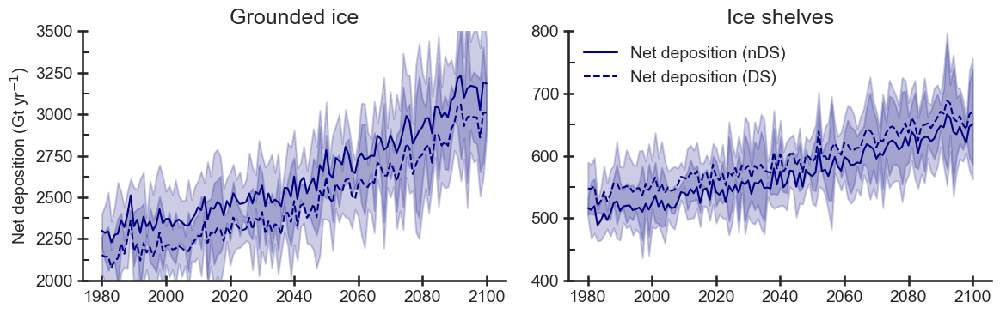

In [ ]:
# Net deposition time series, integrated (Gt yr-1).
# Shading: +/- 1.64 across the four models.

netdep = {"grd": {}, "shelf": {}}

for reg in ["grd", "shelf"]:
    df_nds = pd.DataFrame(index=years, columns=list_mod_names, dtype=float)
    df_ds = pd.DataFrame(index=years, columns=list_mod_names, dtype=float)

    for mod in list_mod_names:
        df_nds[mod] = ref_dic[reg][mod]["SF"]
        df_ds[mod] = bs_dic[reg][mod]["SF"] - bs_dic[reg][mod]["ER"]

    netdep[reg]["nDS_mean"] = df_nds.mean(axis=1)
    netdep[reg]["nDS_std"] = df_nds.std(axis=1)
    netdep[reg]["DS_mean"] = df_ds.mean(axis=1)
    netdep[reg]["DS_std"] = df_ds.std(axis=1)

fig, ax2 = plt.subplots(nrows=1, ncols=2, figsize=(12, 4))

col = "navy"
z = 1.64
alpha_band = 0.2

for j, reg in enumerate(["grd", "shelf"]):
    ax2[j].plot(years, netdep[reg]["nDS_mean"], color=col, lw=1.5, ls="solid",
                label="Net deposition (nDS)" if j == 1 else None)
    ax2[j].fill_between(
        years,
        netdep[reg]["nDS_mean"] + z * netdep[reg]["nDS_std"],
        netdep[reg]["nDS_mean"] - z * netdep[reg]["nDS_std"],
        color=col, alpha=alpha_band
    )

    ax2[j].plot(years, netdep[reg]["DS_mean"], color=col, lw=1.5, ls="dashed",
                label="Net deposition (DS)" if j == 1 else None)
    ax2[j].fill_between(
        years,
        netdep[reg]["DS_mean"] + z * netdep[reg]["DS_std"],
        netdep[reg]["DS_mean"] - z * netdep[reg]["DS_std"],
        color=col, alpha=alpha_band
    )

    if j == 0:
        ax2[j].set_ylabel("Net deposition (Gt yr$^{-1}$)", fontsize=14)

    ax2[j].set_xlabel("", fontsize=5)
    ax2[j].tick_params(axis="x", labelsize=14)
    ax2[j].tick_params(axis="y", labelsize=14)
    ax2[j].yaxis.set_minor_locator(mticker.AutoMinorLocator(n=2))
    ax2[j].tick_params(axis="y", which="major", direction="inout", left=True, right=False)
    ax2[j].tick_params(axis="y", which="minor", direction="in", left=True, right=False)
    ax2[j].tick_params(axis="x", which="major", direction="inout", top=False, bottom=True)
    ax2[j].axhline(color="black", alpha=1, lw=1)

ax2[0].set_title("Grounded ice", fontsize=18)
ax2[1].set_title("Ice shelves", fontsize=18)
ax2[1].legend(frameon=False, prop={"size": 14}, loc="upper left")

plt.tight_layout()
sns.despine()

ax2[0].set_ylim(2000, 3500)
ax2[1].set_ylim(400, 800)

plt.show()

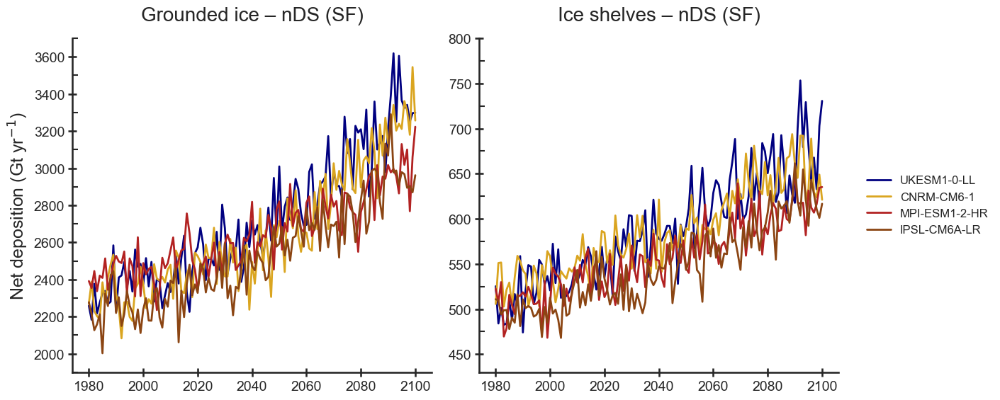

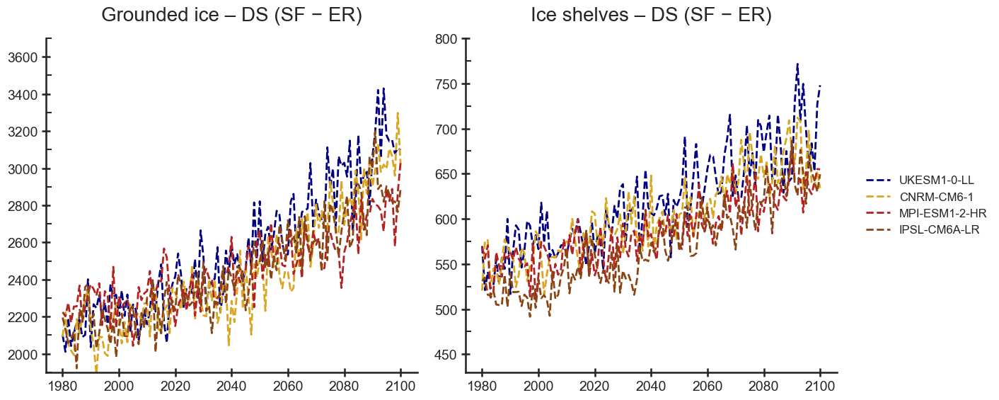

In [ ]:
# Net deposition per model

model_order = [
    ("UKM", "UKESM1-0-LL", "navy"),
    ("CM6", "CNRM-CM6-1", "goldenrod"),
    ("MPI", "MPI-ESM1-2-HR", "firebrick"),
    ("IPL", "IPSL-CM6A-LR", "saddlebrown"),
]
model_order = [(k, lab, col) for (k, lab, col) in model_order if k in set(list_mod_names)]

ylim_grd = (1900, 3700)
ylim_shlf = (430, 800)


def _style_axis(ax):
    ax.tick_params(axis="x", labelsize=14)
    ax.tick_params(axis="y", labelsize=14)
    ax.yaxis.set_minor_locator(mticker.AutoMinorLocator(n=2))
    ax.tick_params(axis="y", which="major", direction="inout", left=True, right=False)
    ax.tick_params(axis="y", which="minor", direction="in", left=True, right=False)
    ax.tick_params(axis="x", which="major", direction="inout", top=False, bottom=True)
    ax.axhline(color="black", alpha=0.7, lw=1)


fig_nds, ax_nds = plt.subplots(1, 2, figsize=(15, 6), sharex=True)

for j, (reg, title) in enumerate([("grd", "Grounded ice"), ("shelf", "Ice shelves")]):
    for key, label, col in model_order:
        ax_nds[j].plot(years, ref_dic[reg][key]["SF"],
                       color=col, lw=2.0, ls="solid",
                       label=label if j == 1 else None)

    ax_nds[j].set_title(f"{title} - nDS (SF)", fontsize=20, pad=18)
    _style_axis(ax_nds[j])

ax_nds[0].set_ylim(*ylim_grd)
ax_nds[1].set_ylim(*ylim_shlf)
ax_nds[0].set_ylabel("Net deposition (Gt yr$^{-1}$)", fontsize=18)
ax_nds[1].legend(frameon=False, prop={"size": 12}, loc="center left",
                 bbox_to_anchor=(1.05, 0.5))

plt.tight_layout()
plt.subplots_adjust(right=0.8)
sns.despine(fig=fig_nds)
plt.show()

fig_ds, ax_ds = plt.subplots(1, 2, figsize=(15, 6), sharex=True)

for j, (reg, title) in enumerate([("grd", "Grounded ice"), ("shelf", "Ice shelves")]):
    for key, label, col in model_order:
        ax_ds[j].plot(years, bs_dic[reg][key]["SF"] - bs_dic[reg][key]["ER"],
                      color=col, lw=2.0, ls="dashed",
                      label=label if j == 1 else None)

    ax_ds[j].set_title(f"{title} - DS (SF - ER)", fontsize=20, pad=18)
    _style_axis(ax_ds[j])

ax_ds[0].set_ylim(*ylim_grd)
ax_ds[1].set_ylim(*ylim_shlf)
ax_ds[1].legend(frameon=False, prop={"size": 12}, loc="center left",
                bbox_to_anchor=(1.05, 0.5))

plt.tight_layout()
plt.subplots_adjust(right=0.8)
sns.despine(fig=fig_ds)
plt.show()

In [4]:
# Paths, masks and helpers shared by all map figures below.

import os

import numpy as np
import xarray as xr
import matplotlib.pyplot as plt
from matplotlib.patches import Circle

try:
    from IPython.display import display
except ImportError:
    display = print

BASE_DIR = "/Users/dashakan/Desktop/scripts_AIS"
MSK_FILE = os.path.join(BASE_DIR, "MARcst-AN35km-176x148.cdf2")
DS_TMPL = os.path.join(BASE_DIR, "year-MAR-DS_{F}-1980-2100.nc")
NDS_TMPL = os.path.join(BASE_DIR, "year-MAR-nDS_{F}-1980-2100.nc")

FORCINGS = ["IPL", "UKM", "MPI", "CNRM"]
COL_TITLES = {"IPL": "MAR-IPSL", "UKM": "MAR-UKESM",
              "MPI": "MAR-MPI", "CNRM": "MAR-CNRM"}

BASE_Y0, BASE_Y1 = 1981, 2010
FUT_Y0, FUT_Y1 = 2071, 2100

REGION = "ice"  # ice | grounded | shelf
FLUX_VARS = {"SMB", "ME", "RU", "SU", "NetDep"}

NUISANCE_DIMS = [
    "SECTOR", "SECTOR1_1", "SECTOR_1", "sector",
    "NUMBER", "number", "member", "MEMBER",
    "ensemble", "ENS", "bnds", "nv", "nbnd", "bounds", "ATMLAY"
]

msk = xr.open_dataset(MSK_FILE, engine="netcdf4", decode_times=False)

ICE = (msk["ICE"] > 0)
GROUND = (msk["GROUND"] > 0)
SHELF = ICE & (~GROUND)

REGIONS = {"ice": ICE, "grounded": ICE & GROUND, "shelf": SHELF}
REGMASK = REGIONS[REGION].values

x2, y2 = np.meshgrid(msk["X"].values, msk["Y"].values)


def preprocess_1(ds: xr.Dataset) -> xr.Dataset:
    """Drop the SECTOR dimension and upper-case the horizontal dims."""
    for d in ["SECTOR", "SECTOR1_1"]:
        if (d in ds.dims) or (d in ds.coords):
            try:
                ds = ds.sel({d: 1})
            except Exception:
                try:
                    ds = ds.isel({d: 0})
                except Exception:
                    pass

    rename_dims = {}
    if "x" in ds.dims:
        rename_dims["x"] = "X"
    if "y" in ds.dims:
        rename_dims["y"] = "Y"
    if rename_dims:
        try:
            ds = ds.rename_dims(rename_dims)
        except Exception:
            pass
    return ds


def standardize_da(da: xr.DataArray) -> xr.DataArray:
    """Return the field as (TIME, Y, X), collapsing any leftover dimension."""
    ren = {}
    if "time" in da.dims and "TIME" not in da.dims:
        ren["time"] = "TIME"
    if "x" in da.dims and "X" not in da.dims:
        ren["x"] = "X"
    if "y" in da.dims and "Y" not in da.dims:
        ren["y"] = "Y"
    if ren:
        da = da.rename(ren)

    for d in list(da.dims):
        if d in NUISANCE_DIMS and d not in ("TIME", "Y", "X"):
            da = da.isel({d: 0})

    for d in list(da.dims):
        if d not in ("TIME", "Y", "X"):
            da = da.isel({d: 0})

    da = da.squeeze(drop=True)

    if "TIME" not in da.dims:
        raise ValueError(f"{da.name}: TIME missing after standardize. dims={da.dims}")
    if not (("Y" in da.dims) and ("X" in da.dims)):
        raise ValueError(f"{da.name}: expected Y,X after standardize. dims={da.dims}")

    return da.transpose("TIME", "Y", "X")


def assign_years(da: xr.DataArray, start=1980) -> xr.DataArray:
    """Replace the TIME coordinate by calendar years unless it already holds them."""
    t = np.asarray(da["TIME"].values).astype(float)
    if not (np.nanmin(t) > 1500 and np.nanmax(t) < 2500):
        da = da.assign_coords(TIME=np.arange(start, start + da.sizes["TIME"]).astype(int))
    else:
        da = da.assign_coords(TIME=t.astype(int))
    return da


def mean_period(da: xr.DataArray, y0: int, y1: int) -> xr.DataArray:
    yrs = np.asarray(da["TIME"].values).astype(int)
    idx = np.where((yrs >= y0) & (yrs <= y1))[0]
    if idx.size == 0:
        raise ValueError(f"No TIME indices for {y0}-{y1}. Range={yrs.min()}-{yrs.max()}")
    return da.isel(TIME=idx).mean("TIME", skipna=True)


def _is_yearly_time_axis(da: xr.DataArray) -> bool:
    yrs = np.asarray(da["TIME"].values).astype(float)
    yrs = yrs[np.isfinite(yrs)]
    if yrs.size < 2:
        return True
    step = float(np.nanmedian(np.diff(np.sort(yrs))))
    return np.isfinite(step) and (0.9 <= step <= 1.1)


def to_kg_m2_yr_yearfile(da: xr.DataArray) -> xr.DataArray:
    """Unit conversion for the yearly files: mm WE and yearly kg m-2 need no scaling."""
    u = (da.attrs.get("units", "") or "").strip().lower()
    out = da
    yearly = _is_yearly_time_axis(out)

    if "mm" in u:
        out.attrs["units"] = "kg m-2 yr-1"
        return out

    if ("kg" in u) and ("m-2" in u or "m^-2" in u or "/m2" in u):
        if yearly:
            out.attrs["units"] = "kg m-2 yr-1"
            return out
        if ("s-1" in u) or ("/s" in u):
            out = out * 365.25 * 24 * 3600
            out.attrs["units"] = "kg m-2 yr-1"
            return out
        if ("day" in u) or ("/d" in u) or ("d-1" in u):
            out = out * 365.25
            out.attrs["units"] = "kg m-2 yr-1"
            return out

    out.attrs["units"] = "kg m-2 yr-1"
    return out


def to_kg_m2_yr(da: xr.DataArray) -> xr.DataArray:
    """As above but rate-based units are scaled from the units string alone.

    Used by plot_DS_effect; identical to to_kg_m2_yr_yearfile on yearly mm WE files.
    """
    u = (da.attrs.get("units", "") or "").strip().lower().replace(" ", "")
    out = da
    p99 = float(np.nanpercentile(np.abs(out.values), 99))

    if "kgm-2s-1" in u or "kg/m2/s" in u or ("kg" in u and "s-1" in u and "m-2" in u):
        out = out * 365.25 * 24 * 3600
        out.attrs["units"] = "kg m-2 yr-1"
        return out

    if ("day" in u or "d-1" in u) and ("mm" in u or "kg" in u):
        if p99 < 200.0:
            out = out * 365.25
        else:
            out = out.copy()
        out.attrs["units"] = "kg m-2 yr-1"
        return out

    if ("yr" in u or "year" in u) and ("mm" in u or "kg" in u):
        out = out.copy()
        out.attrs["units"] = "kg m-2 yr-1"
        return out

    return da


def draw_polar_guides(ax, cx, cy, rmax, lw=0.7, color="0.7"):
    """Dashed concentric circles and diagonals centred on (cx, cy)."""
    for frac in [0.35, 0.70, 1.00]:
        ax.add_patch(Circle((cx, cy), frac * rmax, fill=False,
                            ls="--", lw=lw, ec=color, zorder=2))
    for ang in [0, 45, 90, 135]:
        t = np.deg2rad(ang)
        dx = np.array([-rmax, rmax]) * np.cos(t)
        dy = np.array([-rmax, rmax]) * np.sin(t)
        ax.plot(cx + dx, cy + dy, ls="--", lw=lw, color=color, zorder=2)


def add_scalebar_1000km(ax, xmin, xmax, ymin, ymax, length=1000.0,
                        xfrac=0.35, yfrac=0.08, lw=4, fontsize=13, pad=0.035):
    """1000 km scale bar; X and Y are in km."""
    W, H = xmax - xmin, ymax - ymin
    xc = xmin + xfrac * W
    x0, x1 = xc - 0.5 * length, xc + 0.5 * length
    y = ymin + yfrac * H

    ax.plot([x0, x1], [y, y], color="k", lw=lw, solid_capstyle="butt", zorder=20)
    ax.text(xc, y - pad * H, "1000 km",
            ha="center", va="top", fontsize=fontsize, color="k", zorder=21)

## Future anomalies and drifting-snow effect


In [5]:
def plot_DS_effect(VAR, get_da_func_DS=None, get_da_func_nDS=None, title_label=None):
    """3x4 panel of future anomalies: DS, nDS and their difference, one column per forcing."""
    DS_maps = {}
    nDS_maps = {}
    Eff_maps = {}

    for F in FORCINGS:
        fn_DS = DS_TMPL.format(F=F)
        fn_nDS = NDS_TMPL.format(F=F)

        ds_DS = preprocess_1(xr.open_dataset(fn_DS, engine="netcdf4", decode_times=False))
        ds_nDS = preprocess_1(xr.open_dataset(fn_nDS, engine="netcdf4", decode_times=False))

        if get_da_func_DS is None:
            if VAR not in ds_DS.variables:
                raise KeyError(f"{VAR} not in {fn_DS}. Available: {list(ds_DS.data_vars)}")
            da_DS = standardize_da(ds_DS[VAR])
        else:
            da_DS = standardize_da(get_da_func_DS(ds_DS))

        if get_da_func_nDS is None:
            if VAR not in ds_nDS.variables:
                raise KeyError(f"{VAR} not in {fn_nDS}. Available: {list(ds_nDS.data_vars)}")
            da_nDS = standardize_da(ds_nDS[VAR])
        else:
            da_nDS = standardize_da(get_da_func_nDS(ds_nDS))

        da_DS = assign_years(da_DS)
        da_nDS = assign_years(da_nDS)

        if VAR in FLUX_VARS:
            da_DS = to_kg_m2_yr(da_DS)
            da_nDS = to_kg_m2_yr(da_nDS)

        A_DS = mean_period(da_DS, BASE_Y0, BASE_Y1).values
        B_DS = mean_period(da_DS, FUT_Y0, FUT_Y1).values
        D_DS = B_DS - A_DS

        A_n = mean_period(da_nDS, BASE_Y0, BASE_Y1).values
        B_n = mean_period(da_nDS, FUT_Y0, FUT_Y1).values
        D_n = B_n - A_n

        E = D_DS - D_n

        DS_maps[F] = np.where(REGMASK, D_DS, np.nan)
        nDS_maps[F] = np.where(REGMASK, D_n, np.nan)
        Eff_maps[F] = np.where(REGMASK, E, np.nan)

    def row_vmax(dct):
        arrs = [dct[F][np.isfinite(dct[F])] for F in FORCINGS if np.isfinite(dct[F]).any()]
        if not arrs:
            return 1.0
        allv = np.concatenate(arrs)
        vmax = float(np.nanpercentile(np.abs(allv), 98))
        return vmax if vmax > 0 else 1.0

    vmax_DS = row_vmax(DS_maps)
    vmax_nDS = row_vmax(nDS_maps)
    vmax_E = row_vmax(Eff_maps)

    fig, axes = plt.subplots(3, 4, figsize=(13, 10))
    plt.subplots_adjust(left=0.08, right=0.86, wspace=0.05, hspace=0.10)

    row_labels = ["DS: (b-a)", "nDS: (b-a)", "DS - nDS"]
    im_DS = im_nDS = im_E = None

    for j, F in enumerate(FORCINGS):
        ax = axes[0, j]
        im_DS = ax.pcolormesh(x2, y2, DS_maps[F], shading="auto", cmap="RdBu_r",
                              vmin=-vmax_DS, vmax=vmax_DS)
        ax.contour(x2, y2, ICE.astype(float), levels=[0.5], colors="k", linewidths=0.7)
        ax.set_title(COL_TITLES.get(F, F), fontsize=14)
        ax.axis("off")
        ax.set_aspect("equal")

        ax = axes[1, j]
        im_nDS = ax.pcolormesh(x2, y2, nDS_maps[F], shading="auto", cmap="RdBu_r",
                               vmin=-vmax_nDS, vmax=vmax_nDS)
        ax.contour(x2, y2, ICE.astype(float), levels=[0.5], colors="k", linewidths=0.7)
        ax.axis("off")
        ax.set_aspect("equal")

        ax = axes[2, j]
        im_E = ax.pcolormesh(x2, y2, Eff_maps[F], shading="auto", cmap="RdBu_r",
                             vmin=-vmax_E, vmax=vmax_E)
        ax.contour(x2, y2, ICE.astype(float), levels=[0.5], colors="k", linewidths=0.7)
        ax.axis("off")
        ax.set_aspect("equal")

    for i in range(3):
        axes[i, 0].text(-0.12, 0.5, row_labels[i], transform=axes[i, 0].transAxes,
                        rotation=90, va="center", ha="right", fontsize=16)

    unit_label = "°C" if VAR == "TT" else r"kg m$^{-2}$ yr$^{-1}$"

    for im, rect in [(im_DS, [0.88, 0.71, 0.02, 0.20]),
                     (im_nDS, [0.88, 0.41, 0.02, 0.20]),
                     (im_E, [0.88, 0.11, 0.02, 0.20])]:
        cb = fig.colorbar(im, cax=fig.add_axes(rect))
        cb.set_label(unit_label, fontsize=12)

    fig.suptitle(title_label or VAR, fontsize=18, y=0.995)
    fig.text(0.5, 0.945,
             f"(b-a) = ({FUT_Y0}-{FUT_Y1}) - ({BASE_Y0}-{BASE_Y1})",
             ha="center", fontsize=13)

    plt.show()

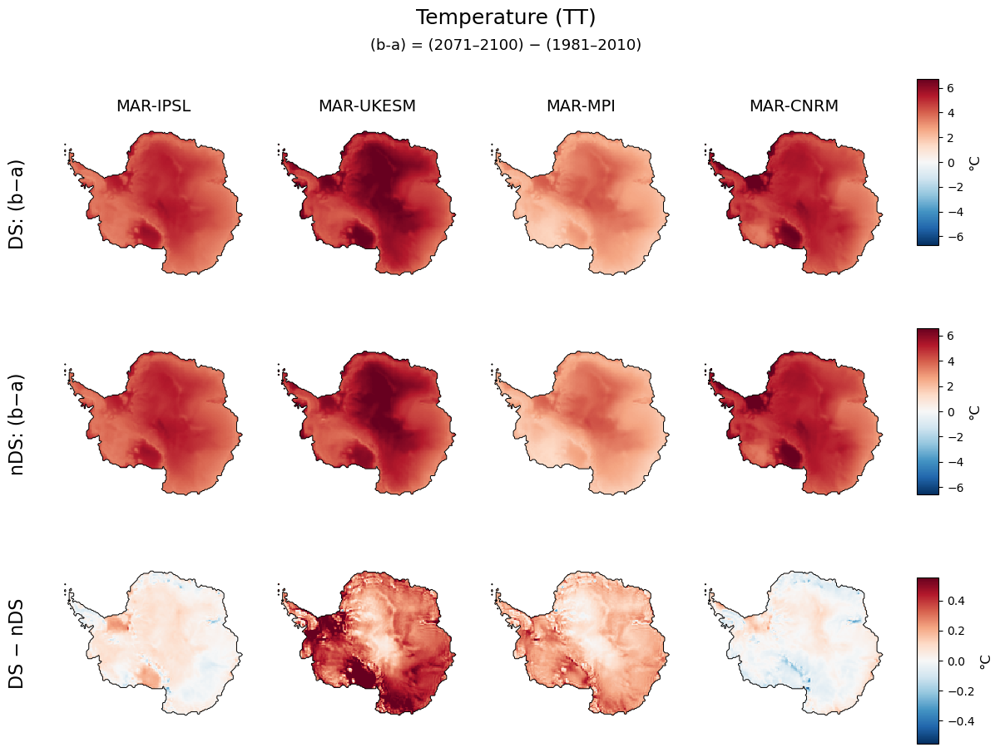

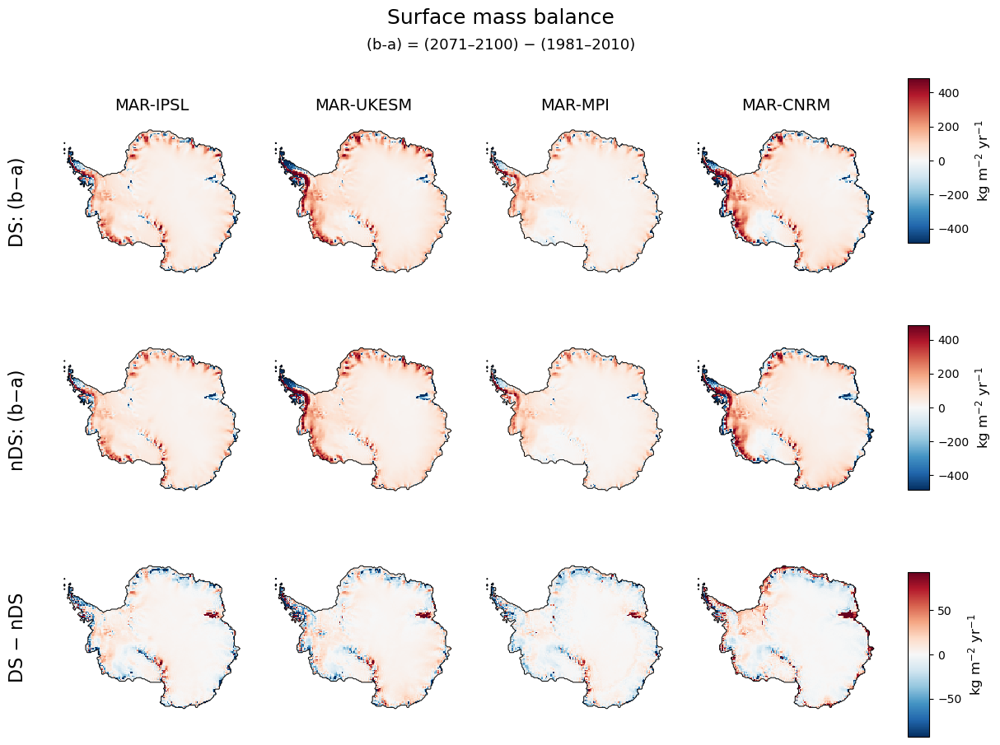

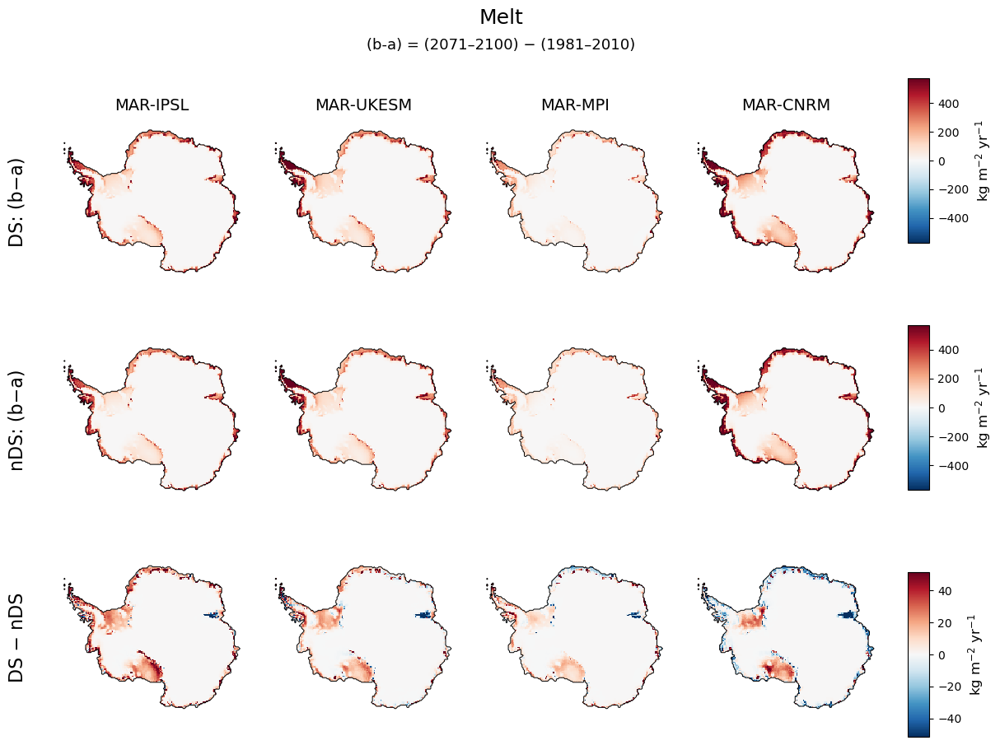

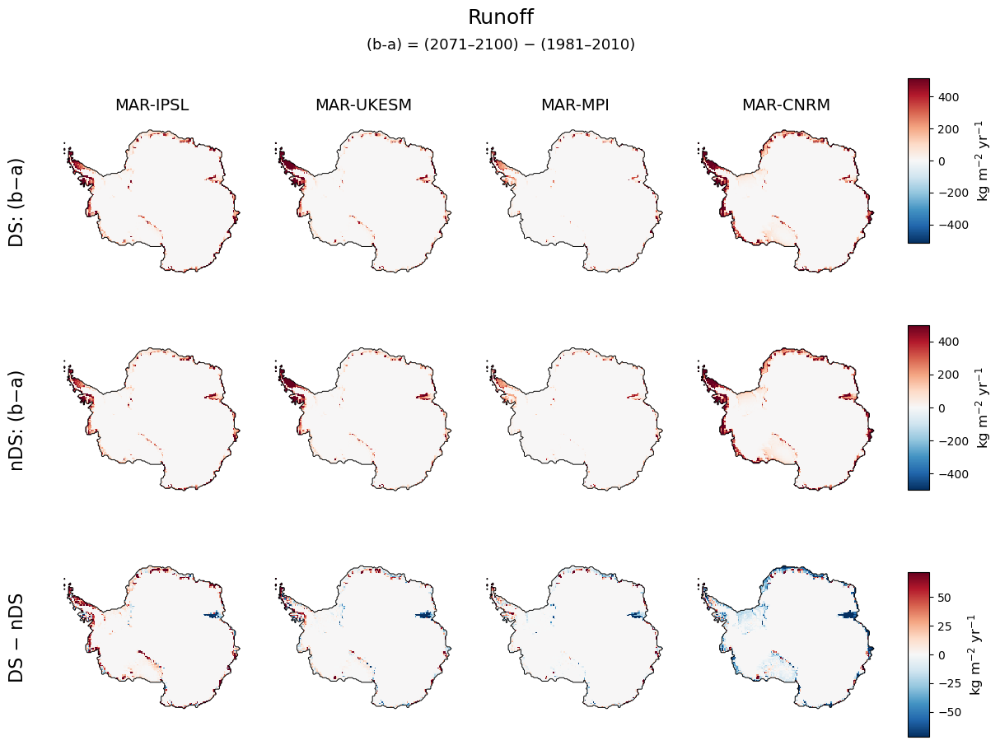

In [6]:
plot_DS_effect("TT", title_label="Temperature (TT)")
plot_DS_effect("SMB", title_label="Surface mass balance")
plot_DS_effect("ME", title_label="Melt")
plot_DS_effect("RU", title_label="Runoff")

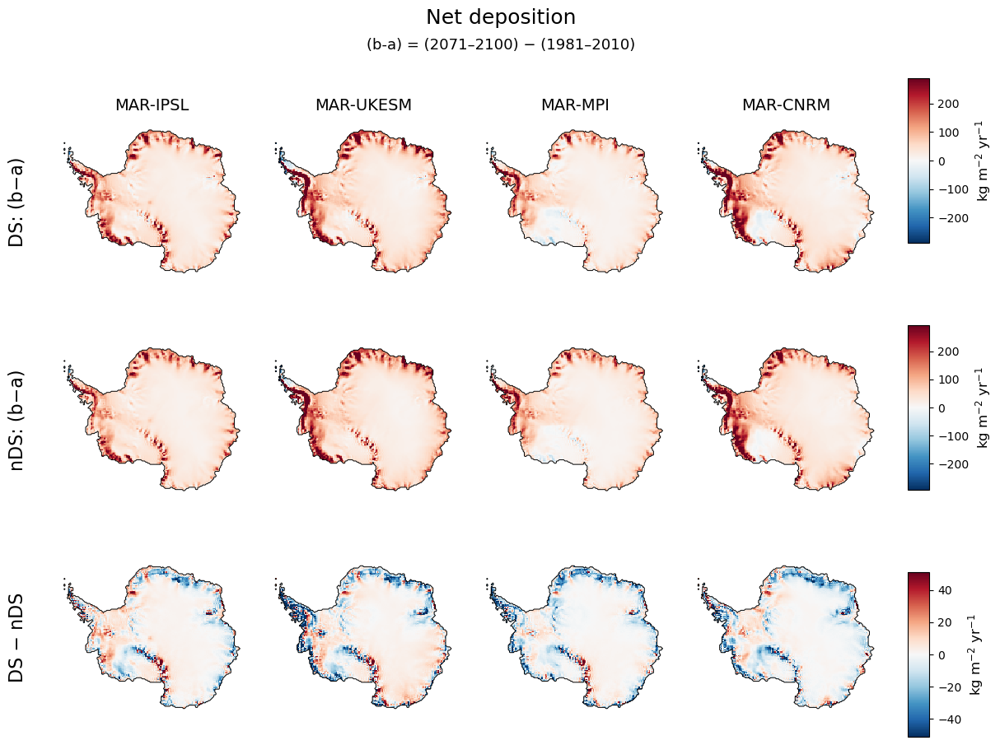

In [7]:
def get_netdep_DS(ds):
    return ds["SF"] - ds["ER"]


def get_netdep_nDS(ds):
    return ds["SF"]


plot_DS_effect(
    "NetDep",
    get_da_func_DS=get_netdep_DS,
    get_da_func_nDS=get_netdep_nDS,
    title_label="Net deposition"
)

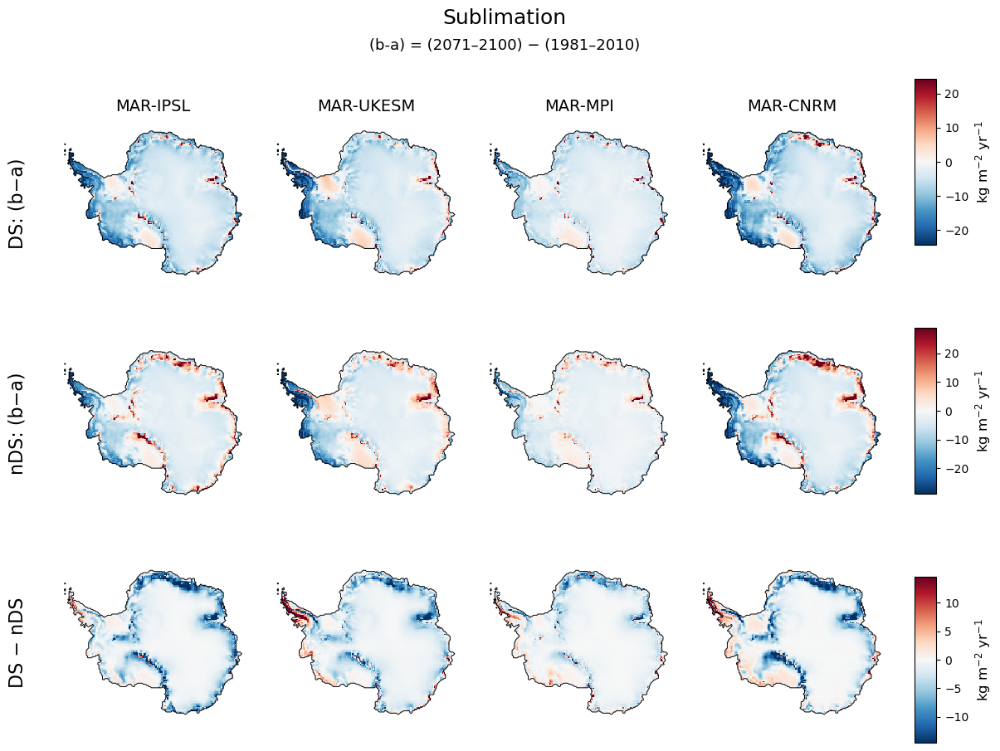

In [8]:
plot_DS_effect("SU", title_label="Sublimation")

## Drifting-snow effect, one panel per forcing

In [ ]:
def plot_DS_minus_nDS_2x2(
    VAR,
    get_da_func_DS=None,
    get_da_func_nDS=None,
    title_label=None,
    hatch_mask=None,
    contour_field=None,
    contour_levels=None,
    figsize=(18, 15),
    dpi=150,
    cax_rect=(0.90, 0.22, 0.02, 0.55)
):
    """DS - nDS = (future - base)_DS - (future - base)_nDS, one panel per forcing."""
    Eff_maps = {}

    for F in FORCINGS:
        fn_DS = DS_TMPL.format(F=F)
        fn_nDS = NDS_TMPL.format(F=F)

        ds_DS = preprocess_1(xr.open_dataset(fn_DS, engine="netcdf4", decode_times=False))
        ds_nDS = preprocess_1(xr.open_dataset(fn_nDS, engine="netcdf4", decode_times=False))

        da_DS = standardize_da(get_da_func_DS(ds_DS)) if get_da_func_DS else standardize_da(ds_DS[VAR])
        da_nDS = standardize_da(get_da_func_nDS(ds_nDS)) if get_da_func_nDS else standardize_da(ds_nDS[VAR])

        da_DS = assign_years(da_DS)
        da_nDS = assign_years(da_nDS)

        if VAR in FLUX_VARS:
            da_DS = to_kg_m2_yr_yearfile(da_DS)
            da_nDS = to_kg_m2_yr_yearfile(da_nDS)

        A_DS = mean_period(da_DS, BASE_Y0, BASE_Y1).values
        B_DS = mean_period(da_DS, FUT_Y0, FUT_Y1).values
        D_DS = B_DS - A_DS

        A_n = mean_period(da_nDS, BASE_Y0, BASE_Y1).values
        B_n = mean_period(da_nDS, FUT_Y0, FUT_Y1).values
        D_n = B_n - A_n

        Eff_maps[F] = np.where(REGMASK, D_DS - D_n, np.nan)

    
    vals = [Eff_maps[F][np.isfinite(Eff_maps[F])] for F in FORCINGS if np.isfinite(Eff_maps[F]).any()]
    vmax = 1.0 if len(vals) == 0 else float(np.nanpercentile(np.abs(np.concatenate(vals)), 98))
    if not np.isfinite(vmax) or vmax == 0:
        vmax = 1.0

    xmin, xmax = float(np.nanmin(x2)), float(np.nanmax(x2))
    ymin, ymax = float(np.nanmin(y2)), float(np.nanmax(y2))
    cx, cy = 0.5 * (xmin + xmax), 0.5 * (ymin + ymax)

    corners = np.array([[xmin, ymin], [xmin, ymax], [xmax, ymin], [xmax, ymax]], dtype=float)
    rmax = float(np.max(np.sqrt((corners[:, 0] - cx) ** 2 + (corners[:, 1] - cy) ** 2)))

    fig, axes = plt.subplots(2, 2, figsize=figsize, dpi=dpi)
    plt.subplots_adjust(left=0.05, right=0.86, wspace=0.10, hspace=0.16)

    letters = ["A", "B", "C", "D"]
    im = None

    for k, F in enumerate(FORCINGS):
        ax = axes.flat[k]

        draw_polar_guides(ax, cx, cy, rmax)

        im = ax.pcolormesh(x2, y2, Eff_maps[F], shading="auto", cmap="RdBu_r",
                           vmin=-vmax, vmax=vmax, zorder=3)

        ax.contour(x2, y2, ICE.astype(float), levels=[0.5],
                   colors="k", linewidths=1.0, zorder=5)

        if contour_field is not None:
            levs = contour_levels if contour_levels is not None else 10
            ax.contour(x2, y2, contour_field, levels=levs,
                       colors="0.6", linewidths=0.8, zorder=4)

        if hatch_mask is not None:
            hm = np.where(hatch_mask, 1.0, np.nan)
            ax.contourf(x2, y2, hm, levels=[0.5, 1.5],
                        colors="none", hatches=["///"], zorder=6)

        ax.set_title(f"{letters[k]}. {title_label or VAR} {COL_TITLES.get(F, F)}",
                     fontsize=18, pad=10)

        ax.set_xlim(xmin, xmax)
        ax.set_ylim(ymin, ymax)
        ax.set_aspect("equal")
        ax.set_xticks([])
        ax.set_yticks([])
        for sp in ax.spines.values():
            sp.set_linewidth(1.1)
            sp.set_color("0.2")

        add_scalebar_1000km(ax, xmin, xmax, ymin, ymax)

    cb = fig.colorbar(im, cax=fig.add_axes(list(cax_rect)), extend="both")
    cb.ax.tick_params(labelsize=14)
    cb.set_label("[°C]" if VAR == "TT" else r"[kg m$^{-2}$ yr$^{-1}$]", fontsize=16)

    plt.show()

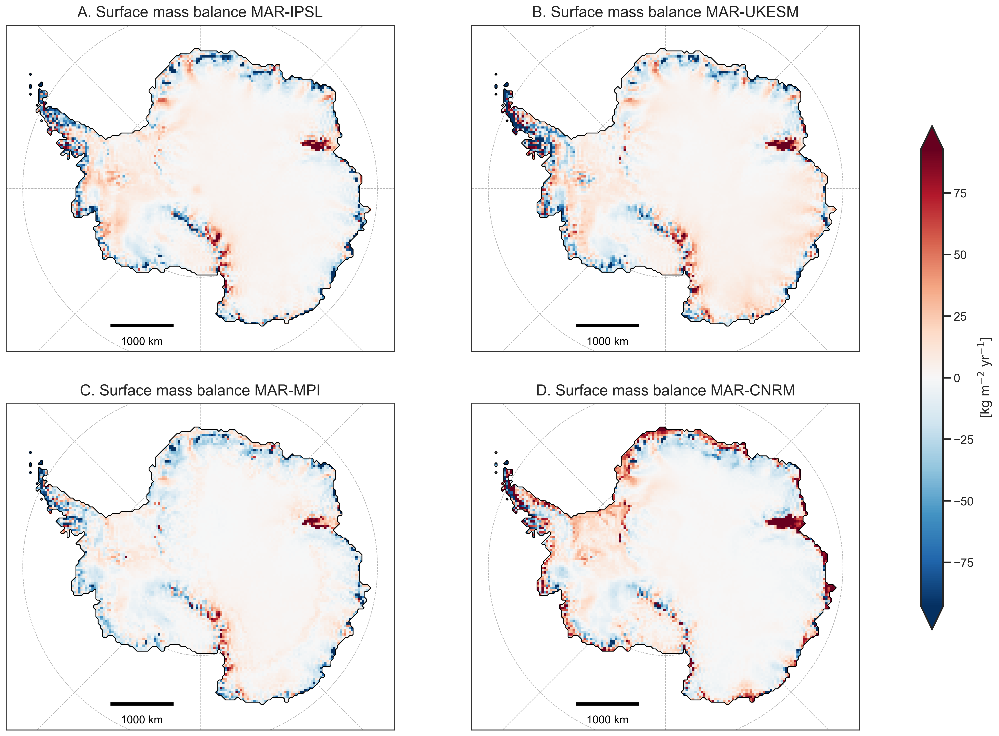

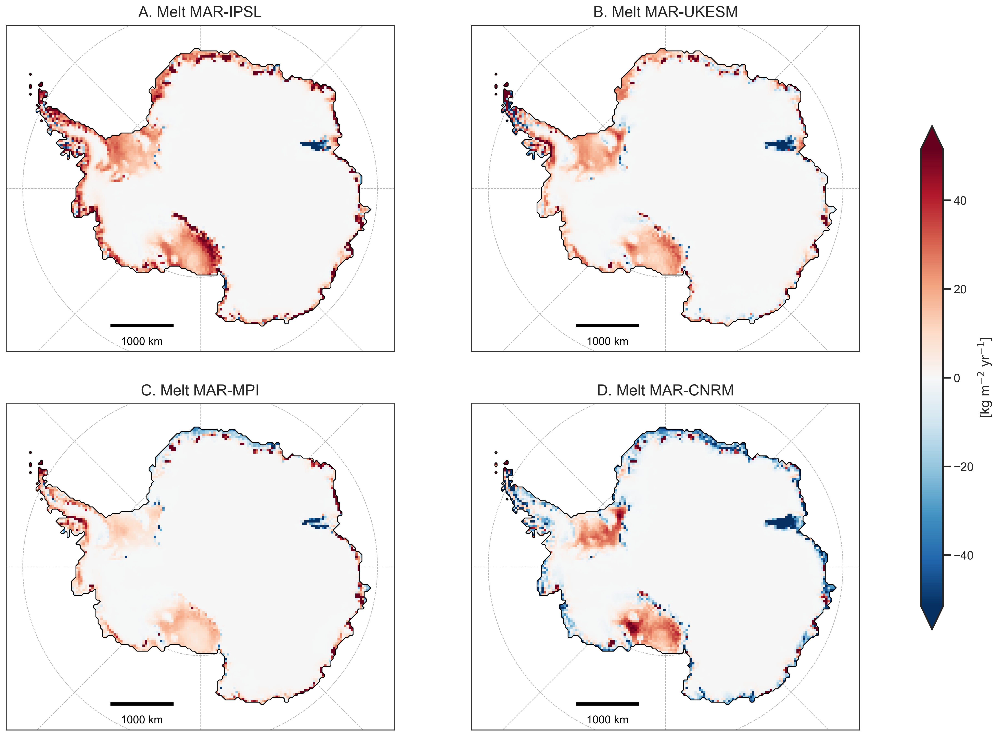

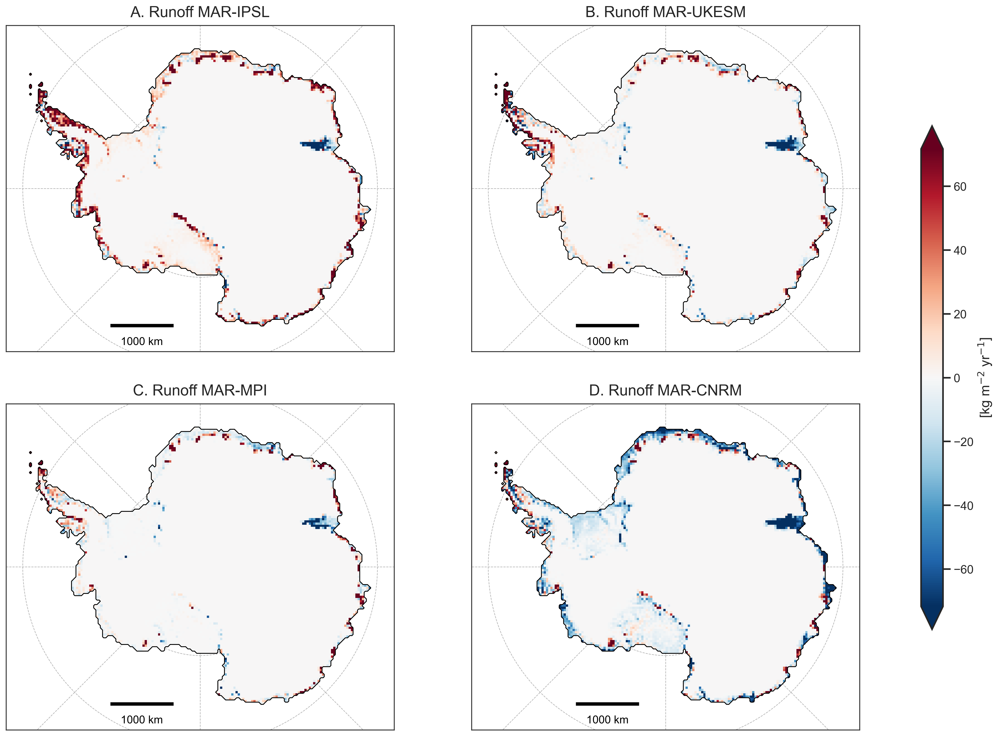

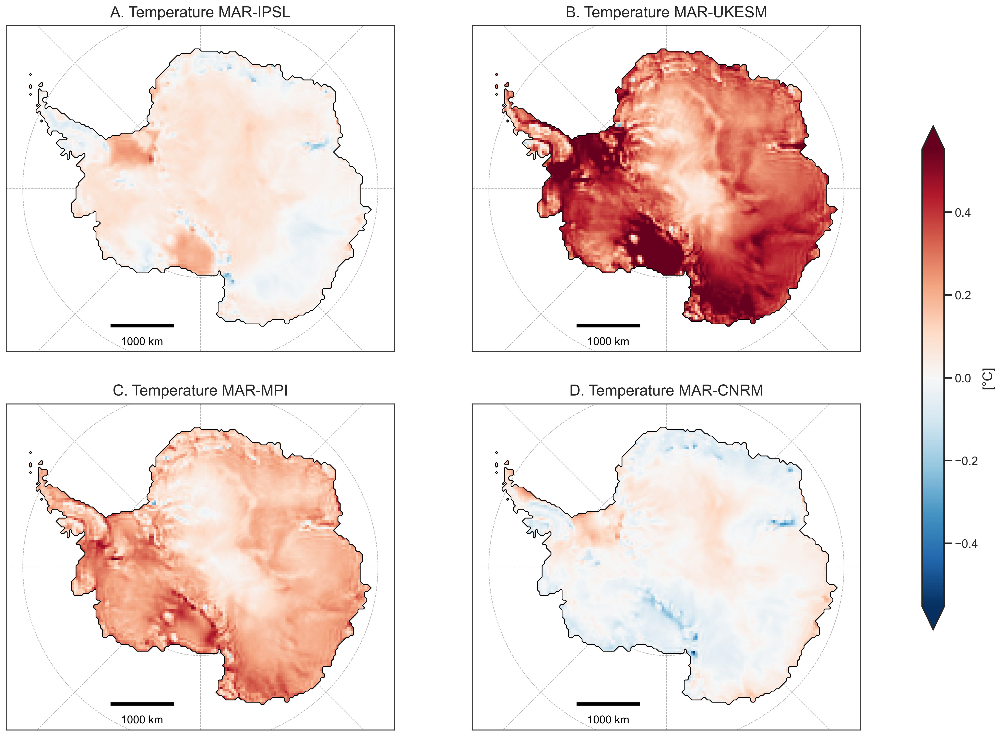

In [10]:
plot_DS_minus_nDS_2x2("SMB", title_label="Surface mass balance")
plot_DS_minus_nDS_2x2("ME", title_label="Melt")
plot_DS_minus_nDS_2x2("RU", title_label="Runoff")
plot_DS_minus_nDS_2x2("TT", title_label="Temperature")

## Melt: drifting-snow effect with significance

Per-pixel Student or Welch test on the DS - nDS melt difference series, chosen by an F-test on
the variances (alpha = 0.05), following `statistics.ipynb`. The table covers the 350-700 m
elevation band on grounded ice, by IMBIE-2 basin.

AREA scale 1000 -> ice 11.43 x10^6 km^2 (expect ~13.9), grounded 10.02 (expect ~12.3)
18 basins: A-Ap, Ap-B, B-C, C-Cp, Cp-D, D-Dp, Dp-E, E-Ep, Ep-F, F-G, G-H, H-Hp, Hp-I, I-Ipp, Ipp-J, J-Jpp, Jpp-K, K-A
grounded cells inside a basin polygon: 96.3%  (<90% -> check SHP_SCALE / CRS)
nearest-basin fill: 992 ice cells (1004.6 x10^3 km^2)
band 350-700 m, grounded: 576 cells, 586 x10^3 km^2
Loading melt …


  MAR-IPSL     p98|DS-nDS| =   59.22 kg m-2 yr-1   significant on 24.7% of the ice sheet
  MAR-UKESM    p98|DS-nDS| =   40.71 kg m-2 yr-1   significant on 21.4% of the ice sheet


  MAR-MPI      p98|DS-nDS| =   35.02 kg m-2 yr-1   significant on 17.6% of the ice sheet
  MAR-CNRM     p98|DS-nDS| =   57.56 kg m-2 yr-1   significant on 21.3% of the ice sheet
colour scale: +/- 50.4 kg m-2 yr-1


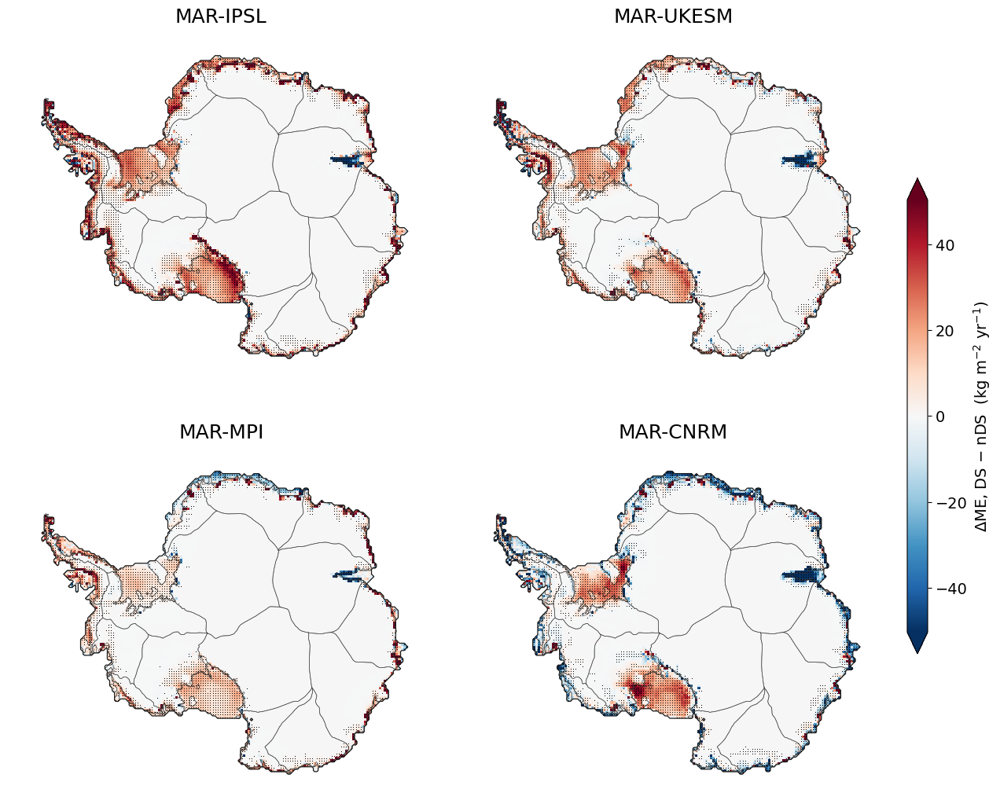

saved /Users/dashakan/Desktop/scripts_AIS/ME_DSeffect_map.png

DS effect on the melt anomaly (1981-2010 -> 2071-2100), 350-700 m, grounded ice   [kg m-2 yr-1]


Model,IPSL,UKESM,MPI,CNRM,MMM
Basin,,,,,
A-Ap,42.92,17.92,27.84,4.40,23.27
Ap-B,60.09,22.55,52.74,-8.08,31.82
B-C,-23.60,-38.73,-35.51,-68.83,-41.67
C-Cp,32.00,2.94,15.52,-14.29,9.04
Cp-D,72.24,22.84,37.53,30.47,40.77
D-Dp,40.12,3.93,5.58,-5.31,11.08
Dp-E,31.11,6.78,-3.58,-15.01,4.82
E-Ep,39.67,-0.12,-1.35,-14.05,6.04
Ep-F,7.18,2.99,2.29,6.02,4.62


same, as % of the nDS melt anomaly


Model,IPSL,UKESM,MPI,CNRM,MMM
Basin,,,,,
A-Ap,38.9,11.2,46.7,2.2,24.7
Ap-B,25.7,9.4,43.8,-2.6,19.1
B-C,-11.3,-14.7,-27.0,-26.5,-19.9
C-Cp,19.1,1.6,16.3,-5.7,7.8
Cp-D,41.1,13.7,51.7,12.0,29.6
D-Dp,29.8,2.9,9.5,-2.8,9.9
Dp-E,16.8,3.7,-3.4,-6.4,2.6
E-Ep,23.5,-0.1,-4.4,-7.2,3.0
Ep-F,21.0,10.0,17.3,9.4,14.4


band area fraction where the DS effect is significant (p < 0.05)


Model,IPSL,UKESM,MPI,CNRM,MMM
Basin,,,,,
A-Ap,0.66,0.46,0.50,0.46,0.52
Ap-B,0.72,0.47,0.61,0.74,0.64
B-C,0.58,0.70,0.53,0.86,0.67
C-Cp,0.31,0.32,0.44,0.73,0.45
Cp-D,0.66,0.51,0.47,0.84,0.62
D-Dp,0.83,0.22,0.39,0.62,0.51
Dp-E,0.97,0.64,0.59,0.57,0.69
E-Ep,0.82,0.57,0.39,0.66,0.61
Ep-F,0.46,0.24,0.51,0.55,0.44


,Basin,Model,N_cells,Area_1e3km2,ME_nDS_base,ME_DS_base,ME_nDS_fut,ME_DS_fut,dME_nDS,dME_DS,DS_effect,DS_effect_pct,Sig_area_frac,dME_nDS_Gt,dME_DS_Gt,DS_effect_Gt,flag
0,A-Ap,IPSL,30.0,29.375,8.139,8.748,118.485,162.013,110.346,153.265,42.919,38.895,0.660,3.241,4.502,1.261,
1,A-Ap,UKESM,30.0,29.375,5.094,3.849,164.979,181.659,159.885,177.810,17.925,11.211,0.455,4.697,5.223,0.527,
2,A-Ap,MPI,30.0,29.375,10.452,8.334,70.035,95.754,59.582,87.419,27.837,46.720,0.499,1.750,2.568,0.818,
3,A-Ap,CNRM,30.0,29.375,3.745,3.322,207.027,211.002,203.283,207.680,4.398,2.163,0.465,5.971,6.101,0.129,
4,A-Ap,MMM,30.0,29.375,6.857,6.063,140.131,162.607,133.274,156.544,23.270,24.747,0.520,3.915,4.598,0.684,
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
90,ALL,IPSL,546.0,522.856,17.104,20.459,130.986,155.385,113.882,134.926,21.044,18.479,0.679,59.544,70.547,11.003,
91,ALL,UKESM,546.0,522.856,11.874,10.932,147.740,152.320,135.867,141.388,5.522,4.064,0.441,71.039,73.926,2.887,
92,ALL,MPI,546.0,522.856,23.053,20.727,74.606,80.458,51.553,59.731,8.178,15.864,0.463,26.955,31.231,4.276,
93,ALL,CNRM,546.0,522.856,13.864,14.492,190.099,187.878,176.235,173.387,-2.849,-1.616,0.552,92.146,90.656,-1.490,


saved -> /Users/dashakan/Desktop/scripts_AIS/tables


In [ ]:
# Melt: drifting-snow effect (DS - nDS)
#   part 1: 2x2 maps, IMBIE-2 basin contours, significance overlay
#   part 2: DS impact on melt per basin and model, 350-700 m elevation band
#
# Significance as in statistics.ipynb: per pixel, base window against future window,
# Student or Welch chosen by an F-test on the variances, alpha = 0.05. The test is
# applied to the DS - nDS melt difference series d(t), so it tests the mapped
# quantity mean_fut(d) - mean_base(d).
#
# Self-contained: reads the grid file, the basin shapefile and the yearly MAR files
# directly, so it does not depend on the setup cell above.
import os
import warnings
import numpy as np
import numpy.ma as ma
import pandas as pd
import xarray as xr
import geopandas as gpd
import matplotlib.pyplot as plt
from scipy.ndimage import distance_transform_edt
from scipy.stats import t as t_dist, f as f_dist

try:
    from IPython.display import display
except Exception:
    display = print

# paths
BASE_DIR = "/Users/dashakan/Desktop/scripts_AIS"
MSK_FILE = os.path.join(BASE_DIR, "MARcst-AN35km-176x148.cdf2")
SHP_PATH = "/Users/dashakan/Downloads/ANT_Basins_IMBIE2_v1.6/ANT_Basins_IMBIE2_v1.6.shp"
DS_TMPL  = os.path.join(BASE_DIR, "year-MAR-DS_{F}-1980-2100.nc")
NDS_TMPL = os.path.join(BASE_DIR, "year-MAR-nDS_{F}-1980-2100.nc")
OUT_PNG  = os.path.join(BASE_DIR, "ME_DSeffect_map.png")
OUT_DIR  = os.path.join(BASE_DIR, "tables")

# knobs
FORCINGS   = ["IPL", "UKM", "MPI", "CNRM"]
COL_TITLES = {"IPL": "MAR-IPSL", "UKM": "MAR-UKESM",
              "MPI": "MAR-MPI",  "CNRM": "MAR-CNRM"}
YEAR0 = 1980
BASE_Y0, BASE_Y1 = 1981, 2010
FUT_Y0,  FUT_Y1  = 2071, 2100

ALPHA = 0.05
SIG_STYLE = "stipple"     # "stipple" (dots, as statistics.ipynb) | "hatch" | "none"
SIG_OUTLINE = False       # True adds the black contour around significant patches
SIG_STRIDE = 1            # >1 thins the dots if they saturate the panel
ROBUST_CONTOUR = False    # outline where >= SIG_MIN_MODELS models agree in sign
SIG_MIN_MODELS = 3

ELEV_LO, ELEV_HI = 350.0, 700.0   # elevation band for the table, inclusive
MASK_REGION = "grounded"          # band region: "grounded" | "ice"
MIN_CELLS   = 3                   # basins below this are kept but flagged

SHP_FIELD   = "Subregion"         # 18 basin codes; "Regions" = East/West/Peninsula
DROP_NAMES  = ["Islands"]
SHP_SCALE   = 1e-3                # shapefile EPSG:3031 metres -> MAR grid km
SIMPLIFY_KM = 2.0                 # vertex thinning, contours only
FILL_UNASSIGNED, MAX_FILL_CELLS = True, 3

FS_TITLE, FS_LABEL, FS_TICK = 18, 14, 14
VMAX_PCTL  = 98                   # percentile of |DS-nDS| pooled over forcings
VMAX_FIXED = None                 # e.g. 60.0 to hard-set the scale
BASIN_LW, BASIN_COLOR = 0.45, "0.25"
CBAR_RECT  = (0.90, 0.22, 0.02, 0.55)
PCOLOR_SHIFT = 0.0                # X/Y are cell centres; DH for a half-cell offset

plt.rcParams.update({
    "font.family": "sans-serif",
    "font.sans-serif": ["DejaVu Sans"],
    "mathtext.fontset": "dejavusans",
    "axes.titlesize": FS_TITLE, "axes.labelsize": FS_LABEL,
    "xtick.labelsize": FS_TICK, "ytick.labelsize": FS_TICK,
    "hatch.linewidth": 0.4,
})

# 1. MAR grid, masks, areas
_m = xr.open_dataset(MSK_FILE, decode_times=False, engine="netcdf4")
Xk = np.asarray(_m["X"].values, float)
Yk = np.asarray(_m["Y"].values, float)
XX, YY = np.meshgrid(Xk, Yk)
NY, NX = XX.shape
CELL_KM = float(np.median(np.diff(Xk)))
DH = 0.5 * CELL_KM


def _f2d(name):
    a = np.asarray(_m[name].values, float).squeeze()
    if a.shape != (NY, NX) and a.T.shape == (NY, NX):
        a = a.T
    if a.shape != (NY, NX):
        raise ValueError(f"{name}: shape {a.shape} != {(NY, NX)}")
    return a


AIS_M, ICE_P, GRD_P = _f2d("AIS") > 0, _f2d("ICE"), _f2d("GROUND")
ICE_FR, GRD_FR = ICE_P / 100.0, GRD_P / 100.0
SH_M, AREA_RAW = _f2d("SH"), _f2d("AREA")

# AREA units: MARcst holds 10^3 km^2 per cell (~1.055 at 35 km) 
_guess = float(np.nansum(AREA_RAW * ICE_FR * AIS_M))
if 5e3 < _guess < 5e4:
    AREA_SCALE = 1e3
elif 5e6 < _guess < 5e7:
    AREA_SCALE = 1.0
else:
    AREA_SCALE = 1e3
    print(f"[warn] AREA unit check inconclusive (sum={_guess:.3g}); assuming 10^3 km^2")
AREA_KM2 = AREA_RAW * AREA_SCALE

MASK_ICE = AIS_M & (ICE_P > 30)
MASK_GRD = MASK_ICE & (GRD_P > 30)
BAND = (SH_M >= ELEV_LO) & (SH_M <= ELEV_HI)

print(f"AREA scale {AREA_SCALE:g} -> ice {np.nansum(AREA_KM2 * ICE_FR * AIS_M) * 1e-6:.2f} "
      f"x10^6 km^2 (expect ~13.9), grounded "
      f"{np.nansum(AREA_KM2 * GRD_FR * AIS_M) * 1e-6:.2f} (expect ~12.3)")

# 2. IMBIE-2 basins on the grid
_g = gpd.read_file(SHP_PATH)
if _g.crs is None:
    print("[warn] shapefile has no CRS — assuming EPSG:3031")
else:
    _g = _g.to_crs("EPSG:3031")
if SHP_FIELD not in _g.columns:
    raise KeyError(f"{SHP_FIELD} not in {list(_g.columns)}")
_g = _g[~_g[SHP_FIELD].astype(str).str.strip().isin(DROP_NAMES)]
_g = _g.dissolve(by=SHP_FIELD).reset_index()
_g["geometry"] = _g.geometry.scale(SHP_SCALE, SHP_SCALE, origin=(0, 0))

BASIN_NAMES = {i: str(n) for i, n in enumerate(_g[SHP_FIELD].tolist(), start=1)}
print(f"{len(BASIN_NAMES)} basins: {', '.join(BASIN_NAMES[i] for i in sorted(BASIN_NAMES))}")

BASIN_XY = []
for geom in _g.geometry.simplify(SIMPLIFY_KM):
    for poly in (geom.geoms if geom.geom_type == "MultiPolygon" else [geom]):
        for ring in [poly.exterior] + list(poly.interiors):
            c = np.asarray(ring.coords)
            BASIN_XY.append((c[:, 0], c[:, 1]))


def draw_basin_contours(ax, lw=BASIN_LW, color=BASIN_COLOR, zorder=8, alpha=0.9):
    for xl, yl in BASIN_XY:
        ax.plot(xl, yl, lw=lw, color=color, alpha=alpha, zorder=zorder,
                solid_joinstyle="round")


def draw_coast(ax, color="0.10", lw_ice=0.9, lw_grd=0.5, zorder=7):
    """Ice margin + grounding line — stands in for shade.layout()."""
    ax.contour(XX, YY, MASK_ICE.astype(float), levels=[0.5],
               colors=color, linewidths=lw_ice, zorder=zorder)
    ax.contour(XX, YY, MASK_GRD.astype(float), levels=[0.5],
               colors=color, linewidths=lw_grd, zorder=zorder)


try:                                     # shapely >= 2
    from shapely import contains_xy as _contains_xy
    _V2 = True
except Exception:                        # shapely 1.x
    from shapely.geometry import Point
    from shapely.prepared import prep
    _V2 = False

BASIN_ID = np.zeros((NY, NX), dtype=np.int16)
for i, geom in zip(sorted(BASIN_NAMES), _g.geometry):
    x0, y0, x1, y1 = geom.bounds
    cand = (AIS_M & (BASIN_ID == 0) &
            (XX >= x0 - CELL_KM) & (XX <= x1 + CELL_KM) &
            (YY >= y0 - CELL_KM) & (YY <= y1 + CELL_KM))
    if not cand.any():
        continue
    px, py = XX[cand], YY[cand]
    if _V2:
        inside = np.asarray(_contains_xy(geom, px, py), bool)
    else:
        pg = prep(geom)
        inside = np.fromiter((pg.contains(Point(a, b)) for a, b in zip(px, py)),
                             bool, px.size)
    BASIN_ID.flat[np.flatnonzero(cand.ravel())[inside]] = i

print(f"grounded cells inside a basin polygon: "
      f"{100 * (BASIN_ID[MASK_GRD] > 0).mean():.1f}%  (<90% -> check SHP_SCALE / CRS)")

if FILL_UNASSIGNED:
    _known = BASIN_ID > 0
    _dist, _ind = distance_transform_edt(~_known, return_distances=True,
                                         return_indices=True)
    _tgt = MASK_ICE & (~_known) & (_dist <= MAX_FILL_CELLS)
    BASIN_ID[_tgt] = BASIN_ID[_ind[0][_tgt], _ind[1][_tgt]]
    print(f"nearest-basin fill: {int(_tgt.sum())} ice cells "
          f"({np.nansum(AREA_KM2[_tgt]) * 1e-3:.1f} x10^3 km^2)")

_bandg = BAND & (MASK_GRD if MASK_REGION == "grounded" else MASK_ICE)
print(f"band {ELEV_LO:.0f}-{ELEV_HI:.0f} m, {MASK_REGION}: {int(_bandg.sum())} cells, "
      f"{np.nansum(AREA_KM2[_bandg]) * 1e-3:.0f} x10^3 km^2")

# 3. melt fields + significance
_KEEP = ("TIME", "Y", "X")


def _read_me(path):
    """ME as (TIME, Y, X) with integer years; yearly files are kg m-2 yr-1."""
    ds = xr.open_dataset(path, decode_times=False, engine="netcdf4")
    for d in ("SECTOR", "SECTOR1_1"):
        if d in ds.dims or d in ds.coords:
            try:
                ds = ds.sel({d: 1})
            except Exception:
                try:
                    ds = ds.isel({d: 0})
                except Exception:
                    pass
    da = ds["ME"]
    ren = {k: v for k, v in (("x", "X"), ("y", "Y"), ("time", "TIME")) if k in da.dims}
    if ren:
        da = da.rename(ren)
    for d in [d for d in da.dims if d not in _KEEP]:
        da = da.isel({d: 0})
    da = da.squeeze(drop=True).transpose("TIME", "Y", "X")
    if da.shape[1:] != (NY, NX):
        raise ValueError(f"ME map shape {da.shape[1:]} != {(NY, NX)}")
    try:
        t = np.asarray(da["TIME"].values, float)
        ok = np.isfinite(t).all() and t.min() > 1500 and t.max() < 2500
    except Exception:
        ok = False
    yrs = t.astype(int) if ok else np.arange(YEAR0, YEAR0 + da.sizes["TIME"])
    return da.values, np.asarray(yrs, int)


def _win(cube, yrs, y0, y1):
    idx = np.flatnonzero((yrs >= y0) & (yrs <= y1))
    if idx.size == 0:
        raise ValueError(f"no years {y0}-{y1}; file covers {yrs.min()}-{yrs.max()}")
    return cube[idx]


def pixel_sig(a, b, alpha=ALPHA):
    """Per-pixel two-sample test on (T, Y, X) windows.

    Student or Welch selected by a two-sided F-test on the variances at 5%,
    i.e. the pixel_pvals_student_or_welch logic of statistics.ipynb, written
    out in closed form so it runs on the full grid in a fraction of a second.
    """
    a = np.asarray(a, float)
    b = np.asarray(b, float)
    with np.errstate(all="ignore"), warnings.catch_warnings():
        warnings.simplefilter("ignore")
        na = np.isfinite(a).sum(0).astype(float)
        nb = np.isfinite(b).sum(0).astype(float)
        m1, m2 = np.nanmean(a, 0), np.nanmean(b, 0)
        v1, v2 = np.nanvar(a, 0, ddof=1), np.nanvar(b, 0, ddof=1)
        ok = (na >= 2) & (nb >= 2) & (v1 > 0) & (v2 > 0)

        cdf = f_dist.cdf(v1 / v2, na - 1, nb - 1)          # F-test
        p_f = 2 * np.minimum(cdf, 1 - cdf)
        equal_var = np.where(np.isfinite(p_f), p_f > 0.05, False)

        sp2 = ((na - 1) * v1 + (nb - 1) * v2) / (na + nb - 2)      # Student
        p_s = 2 * t_dist.sf(np.abs((m1 - m2) / np.sqrt(sp2 * (1 / na + 1 / nb))),
                            na + nb - 2)
        s1, s2 = v1 / na, v2 / nb                                   # Welch
        p_w = 2 * t_dist.sf(np.abs((m1 - m2) / np.sqrt(s1 + s2)),
                            (s1 + s2) ** 2 / (s1 ** 2 / (na - 1) + s2 ** 2 / (nb - 1)))

        p = np.where(ok, np.where(equal_var, p_s, p_w), np.nan)
    return p, np.isfinite(p) & (p < alpha)


print("Loading melt …")
ME, EFF, SIG = {}, {}, {}
for F in FORCINGS:
    cubes = {}
    for run, tmpl in (("DS", DS_TMPL), ("nDS", NDS_TMPL)):
        cube, yrs = _read_me(tmpl.format(F=F))
        ME[(F, run)] = (_win(cube, yrs, BASE_Y0, BASE_Y1).mean(0),
                        _win(cube, yrs, FUT_Y0, FUT_Y1).mean(0))
        cubes[run] = (cube, yrs)
    d = cubes["DS"][0] - cubes["nDS"][0]                    # DS − nDS series
    yrs = cubes["DS"][1]
    _, sig = pixel_sig(_win(d, yrs, BASE_Y0, BASE_Y1), _win(d, yrs, FUT_Y0, FUT_Y1))
    SIG[F] = sig & MASK_ICE
    (bD, fD), (bN, fN) = ME[(F, "DS")], ME[(F, "nDS")]
    EFF[F] = np.where(MASK_ICE, (fD - bD) - (fN - bN), np.nan)
    print(f"  {COL_TITLES[F]:<12s} p98|DS-nDS| = "
          f"{np.nanpercentile(np.abs(EFF[F]), 98):7.2f} kg m-2 yr-1   "
          f"significant on {100 * SIG[F][MASK_ICE].mean():.1f}% of the ice sheet")
    del cubes, d

if ROBUST_CONTOUR:
    _pos = sum((SIG[F] & (EFF[F] > 0)).astype(int) for F in FORCINGS)
    _neg = sum((SIG[F] & (EFF[F] < 0)).astype(int) for F in FORCINGS)
    ROBUST = ((_pos >= SIG_MIN_MODELS) | (_neg >= SIG_MIN_MODELS)) & MASK_ICE
    print(f"significant and same sign in >= {SIG_MIN_MODELS} models: "
          f"{100 * ROBUST[MASK_ICE].mean():.1f}% of the ice sheet")

# 4. figure
_pool = np.concatenate([EFF[F][np.isfinite(EFF[F])] for F in FORCINGS])
VMAX = float(VMAX_FIXED if VMAX_FIXED else np.nanpercentile(np.abs(_pool), VMAX_PCTL))
print(f"colour scale: +/- {VMAX:.1f} kg m-2 yr-1")

fig, axes = plt.subplots(2, 2, figsize=(13, 11))
im = None
for ax, F in zip(axes.ravel(), FORCINGS):
    im = ax.pcolormesh(XX + PCOLOR_SHIFT, YY + PCOLOR_SHIFT, ma.masked_invalid(EFF[F]),
                       shading="auto", cmap="RdBu_r", vmin=-VMAX, vmax=VMAX,
                       zorder=3, rasterized=True)
    draw_coast(ax)
    draw_basin_contours(ax)

    show = SIG[F] & np.isfinite(EFF[F])
    if SIG_STYLE == "stipple":
        if SIG_OUTLINE:
            ax.contour(XX, YY, show.astype(float), levels=[0.5],
                       colors="black", linewidths=0.8, zorder=9)
        iy, ix = np.where(show)
        ax.scatter(XX[iy[::SIG_STRIDE], ix[::SIG_STRIDE]],
                   YY[iy[::SIG_STRIDE], ix[::SIG_STRIDE]],
                   s=2, c="black", marker=".", linewidths=0, zorder=10)
    elif SIG_STYLE == "hatch":
        ax.contourf(XX, YY, np.where(show, 1.0, np.nan), levels=[0.5, 1.5],
                    colors="none", hatches=["///"], zorder=6)

    if ROBUST_CONTOUR:
        rc = ROBUST & np.isfinite(EFF[F])
        ax.contour(XX, YY, rc.astype(float), levels=[0.5],
                   colors="k", linewidths=2.0, zorder=11)
        ax.contour(XX, YY, rc.astype(float), levels=[0.5],
                   colors="yellow", linewidths=1.2, linestyles="--", zorder=12)

    ax.set_title(COL_TITLES[F], fontsize=FS_TITLE)
    ax.set_aspect("equal")
    ax.axis("off")

cax = fig.add_axes(list(CBAR_RECT))
cb = fig.colorbar(im, cax=cax, extend="both")
cb.set_label(r"$\Delta$ME, DS $-$ nDS  (kg m$^{-2}$ yr$^{-1}$)", fontsize=FS_LABEL)
cb.ax.tick_params(labelsize=FS_TICK)

fig.patch.set_facecolor("white")
plt.subplots_adjust(wspace=0.06, hspace=0.12, left=0.02, right=0.88,
                    top=0.95, bottom=0.04)
plt.show()
fig.savefig(OUT_PNG, dpi=300, bbox_inches="tight")
fig.savefig(OUT_PNG.replace(".png", ".pdf"), bbox_inches="tight")
print("saved", OUT_PNG)

# 5. table: DS impact on melt in the 350–700 m band
os.makedirs(OUT_DIR, exist_ok=True)
_reg, _fr = (MASK_GRD, GRD_FR) if MASK_REGION == "grounded" else (MASK_ICE, ICE_FR)
W_KM2 = np.where(_reg & BAND, AREA_KM2 * _fr, 0.0)


def _wmean(v, w):
    ok = (w > 0) & np.isfinite(v)
    return float(np.sum(v[ok] * w[ok]) / np.sum(w[ok])) if ok.any() else np.nan


def _gt(v, w):                       # kg m-2 yr-1 over km^2 -> Gt yr-1
    ok = (w > 0) & np.isfinite(v)
    return float(np.sum(v[ok] * w[ok]) * 1e-6) if ok.any() else np.nan


_groups = [(BASIN_NAMES[i], BASIN_ID == i) for i in sorted(BASIN_NAMES)]
_groups.append(("ALL", BASIN_ID > 0))

rows = []
for name, sel in _groups:
    w = np.where(sel, W_KM2, 0.0)
    ncell = int((w > 0).sum())
    for F in FORCINGS:
        (bD, fD), (bN, fN) = ME[(F, "DS")], ME[(F, "nDS")]
        dDS, dND = fD - bD, fN - bN
        eff = dDS - dND
        a_nds, e_mean = _wmean(dND, w), _wmean(eff, w)
        rows.append({
            "Basin": name, "Model": COL_TITLES[F].replace("MAR-", ""),
            "N_cells": ncell, "Area_1e3km2": np.sum(w) * 1e-3,
            "ME_nDS_base": _wmean(bN, w), "ME_DS_base": _wmean(bD, w),
            "ME_nDS_fut":  _wmean(fN, w), "ME_DS_fut":  _wmean(fD, w),
            "dME_nDS": a_nds, "dME_DS": _wmean(dDS, w),
            "DS_effect": e_mean,
            "DS_effect_pct": (100 * e_mean / abs(a_nds)
                              if np.isfinite(a_nds) and abs(a_nds) > 1e-6 else np.nan),
            "Sig_area_frac": _wmean(SIG[F].astype(float), w),
            "dME_nDS_Gt": _gt(dND, w), "dME_DS_Gt": _gt(dDS, w),
            "DS_effect_Gt": _gt(eff, w),
            "flag": "few cells" if ncell < MIN_CELLS else "",
        })

MODEL_ORDER = [COL_TITLES[F].replace("MAR-", "") for F in FORCINGS] + ["MMM"]
BASIN_LIST = [n for n, _ in _groups]

df = pd.DataFrame(rows)
_num = [c for c in df.columns if c not in ("Basin", "Model", "flag")]
mmm = df.groupby("Basin", sort=False)[_num].mean().reset_index()
mmm["Model"], mmm["flag"] = "MMM", ""
df = (pd.concat([df, mmm], ignore_index=True)
        .assign(Basin=lambda t: pd.Categorical(t["Basin"], BASIN_LIST, ordered=True),
                Model=lambda t: pd.Categorical(t["Model"], MODEL_ORDER, ordered=True))
        .sort_values(["Basin", "Model"]).reset_index(drop=True).round(3))

piv_abs = df.pivot_table(index="Basin", columns="Model", values="DS_effect",
                         observed=False)
piv_pct = df.pivot_table(index="Basin", columns="Model", values="DS_effect_pct",
                         observed=False)
piv_sig = df.pivot_table(index="Basin", columns="Model", values="Sig_area_frac",
                         observed=False)

print(f"\nDS effect on the melt anomaly ({BASE_Y0}-{BASE_Y1} -> {FUT_Y0}-{FUT_Y1}), "
      f"{ELEV_LO:.0f}-{ELEV_HI:.0f} m, {MASK_REGION} ice   [kg m-2 yr-1]")
display(piv_abs.round(2))
print("same, as % of the nDS melt anomaly")
display(piv_pct.round(1))
print(f"band area fraction where the DS effect is significant (p < {ALPHA})")
display(piv_sig.round(2))
display(df)

_tag = f"{int(ELEV_LO)}_{int(ELEV_HI)}m_{MASK_REGION}"
df.to_csv(f"{OUT_DIR}/DS_effect_ME_by_basin_{_tag}.csv", index=False)
piv_abs.to_csv(f"{OUT_DIR}/DS_effect_ME_by_basin_{_tag}_pivot.csv")
print("saved ->", OUT_DIR)

## Combined figure

Loading data …
  SU  IPL
  SU  UKM
  SU  MPI
  SU  CNRM
  SMB  IPL
  SMB  UKM
  SMB  MPI
  SMB  CNRM
  TT  IPL
  TT  UKM
  TT  MPI
  TT  CNRM
  RU  IPL
  RU  UKM
  RU  MPI
  RU  CNRM


  ME  IPL
  ME  UKM
  ME  MPI
  ME  CNRM
  NetDep  IPL


  NetDep  UKM
  NetDep  MPI
  NetDep  CNRM


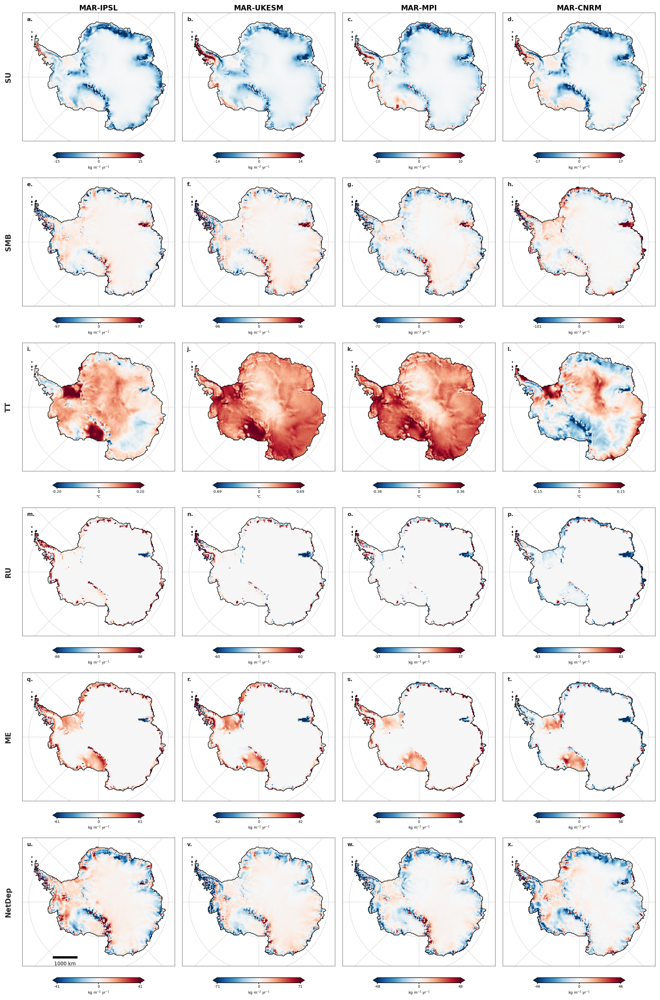

Saved.


In [ ]:


import matplotlib.gridspec as gridspec
from mpl_toolkits.axes_grid1.inset_locator import inset_axes

VARS_CONFIG = [
    ("SU", "SU", r"kg m$^{-2}$ yr$^{-1}$"),
    ("SMB", "SMB", r"kg m$^{-2}$ yr$^{-1}$"),
    ("TT", "TT", "°C"),
    ("RU", "RU", r"kg m$^{-2}$ yr$^{-1}$"),
    ("ME", "ME", r"kg m$^{-2}$ yr$^{-1}$"),
    ("NetDep", "NetDep", r"kg m$^{-2}$ yr$^{-1}$"),
]


def _effect_map(VAR, F):
    ds_DS = preprocess_1(xr.open_dataset(DS_TMPL.format(F=F),
                                         engine="netcdf4", decode_times=False))
    ds_nDS = preprocess_1(xr.open_dataset(NDS_TMPL.format(F=F),
                                          engine="netcdf4", decode_times=False))

    if VAR == "NetDep":
        da_DS = standardize_da(ds_DS["SF"]) - standardize_da(ds_DS["ER"])
        da_DS.attrs["units"] = ds_DS["SF"].attrs.get("units", "")
        da_nDS = standardize_da(ds_nDS["SF"])
    else:
        da_DS = standardize_da(ds_DS[VAR])
        da_nDS = standardize_da(ds_nDS[VAR])

    da_DS, da_nDS = assign_years(da_DS), assign_years(da_nDS)
    if VAR in FLUX_VARS:
        da_DS = to_kg_m2_yr_yearfile(da_DS)
        da_nDS = to_kg_m2_yr_yearfile(da_nDS)

    base_DS = mean_period(da_DS, BASE_Y0, BASE_Y1).values
    fut_DS = mean_period(da_DS, FUT_Y0, FUT_Y1).values
    base_nDS = mean_period(da_nDS, BASE_Y0, BASE_Y1).values
    fut_nDS = mean_period(da_nDS, FUT_Y0, FUT_Y1).values
    return np.where(REGMASK, (fut_DS - base_DS) - (fut_nDS - base_nDS), np.nan)


print("Loading data ...")
Eff = {}
Vmax = {}

for var_key, _, _ in VARS_CONFIG:
    Eff[var_key] = {}
    Vmax[var_key] = {}
    for F in FORCINGS:
        print(f"  {var_key}  {F}")
        E = _effect_map(var_key, F)
        Eff[var_key][F] = E
        finite = E[np.isfinite(E)]
        if finite.size:
            vm = float(np.nanpercentile(np.abs(finite), 98))
            Vmax[var_key][F] = vm if (np.isfinite(vm) and vm > 0) else 1.0
        else:
            Vmax[var_key][F] = 1.0

xmin_g, xmax_g = float(np.nanmin(x2)), float(np.nanmax(x2))
ymin_g, ymax_g = float(np.nanmin(y2)), float(np.nanmax(y2))
cx_g, cy_g = 0.5 * (xmin_g + xmax_g), 0.5 * (ymin_g + ymax_g)
corners = np.array([[xmin_g, ymin_g], [xmin_g, ymax_g],
                    [xmax_g, ymin_g], [xmax_g, ymax_g]], float)
rmax_g = float(np.max(np.sqrt((corners[:, 0] - cx_g) ** 2 + (corners[:, 1] - cy_g) ** 2)))

NROWS, NCOLS = len(VARS_CONFIG), len(FORCINGS)
CMAP = "RdBu_r"

fig = plt.figure(figsize=(15, 22), dpi=180)
gs = gridspec.GridSpec(
    NROWS, NCOLS,
    figure=fig,
    left=0.07, right=0.97,
    top=0.96, bottom=0.03,
    wspace=0.05, hspace=0.22,
)

panel_letters = iter("abcdefghijklmnopqrstuvwx")
ax_col0 = {}

for i, (var_key, row_label, unit_str) in enumerate(VARS_CONFIG):
    for j, F in enumerate(FORCINGS):

        ax = fig.add_subplot(gs[i, j])
        vmax = Vmax[var_key][F]

        if j == 0:
            ax_col0[i] = ax

        if i == 0:
            ax.set_title(COL_TITLES[F], fontsize=11, fontweight="bold", pad=4)

        draw_polar_guides(ax, cx_g, cy_g, rmax_g, lw=0.5, color="0.72")

        im = ax.pcolormesh(x2, y2, Eff[var_key][F],
                           shading="auto", cmap=CMAP,
                           vmin=-vmax, vmax=vmax,
                           zorder=3, rasterized=True)

        ax.contour(x2, y2, ICE.astype(float),
                   levels=[0.5], colors="k", linewidths=0.8, zorder=5)

        ax.set_xlim(xmin_g, xmax_g)
        ax.set_ylim(ymin_g, ymax_g)
        ax.set_aspect("equal")
        ax.set_xticks([])
        ax.set_yticks([])
        for sp in ax.spines.values():
            sp.set_linewidth(0.6)
            sp.set_color("0.4")

        if i == NROWS - 1 and j == 0:
            add_scalebar_1000km(ax, xmin_g, xmax_g, ymin_g, ymax_g,
                                xfrac=0.28, yfrac=0.07, lw=3.5,
                                fontsize=7.5, pad=0.032)

        ax.text(0.03, 0.97, f"{next(panel_letters)}.",
                transform=ax.transAxes,
                fontsize=8.5, fontweight="bold",
                va="top", ha="left", color="0.15", zorder=10)

        # colorbar sits below the map frame
        cax = inset_axes(
            ax,
            width="60%", height="4%",
            loc="lower center",
            bbox_to_anchor=(0.0, -0.13, 1.0, 1.0),
            bbox_transform=ax.transAxes,
            borderpad=0,
        )
        cb = fig.colorbar(im, cax=cax, orientation="horizontal", extend="both")
        cb.ax.tick_params(labelsize=5.5, length=2, pad=1)

        fmt = ".0f" if vmax >= 1 else ".2f"
        cb.set_ticks([-vmax, 0, vmax])
        cb.ax.set_xticklabels([f"{-vmax:{fmt}}", "0", f"{vmax:{fmt}}"], fontsize=5.5)
        cb.set_label(unit_str, fontsize=5.5, labelpad=2)

    pos = ax_col0[i].get_position()
    fig.text(
        pos.x0 - 0.025,
        pos.y0 + 0.5 * pos.height,
        row_label,
        ha="left", va="center",
        rotation=90,
        fontsize=11, fontweight="bold", color="0.15",
    )

plt.savefig("DS_minus_nDS_combined_6vars.pdf", dpi=180, bbox_inches="tight")
plt.savefig("DS_minus_nDS_combined_6vars.png", dpi=180, bbox_inches="tight")
plt.show()

## AIS sum

In [ ]:
# Ice-sheet-wide statistics of the DS effect, printed per variable.

MSK = xr.open_dataset(MSK_FILE, decode_times=False, engine="netcdf4")
_ais = (MSK["AIS"].values > 0)
_ice = MSK["ICE"].values
_area = MSK["AREA"].values

AREA_KM2 = np.where(_ais & (_ice > 30), _ice * _area / 100.0, 0.0)
ICE_MASK = _ais & (_ice > 30)


def _integrate(field):
    v = np.where(ICE_MASK & np.isfinite(field), field, 0.0)
    return float(np.sum(v * AREA_KM2)) * 1e-6


def _mean(field):
    v = field[ICE_MASK & np.isfinite(field)]
    return float(np.nanmean(v)) if v.size else np.nan


def _pct(field, p):
    v = field[ICE_MASK & np.isfinite(field)]
    return float(np.nanpercentile(v, p)) if v.size else np.nan


def _load(VAR, F):
    def _open(tmpl):
        return preprocess_1(xr.open_dataset(tmpl.format(F=F),
                                            engine="netcdf4", decode_times=False))

    def _extract(ds, var):
        da = standardize_da(ds[var])
        da = assign_years(da)
        if var in FLUX_VARS:
            da = to_kg_m2_yr_yearfile(da)
        return da

    da_DS = _extract(_open(DS_TMPL), VAR)
    da_nDS = _extract(_open(NDS_TMPL), VAR)
    return (mean_period(da_DS, BASE_Y0, BASE_Y1).values,
            mean_period(da_DS, FUT_Y0, FUT_Y1).values,
            mean_period(da_nDS, BASE_Y0, BASE_Y1).values,
            mean_period(da_nDS, FUT_Y0, FUT_Y1).values)


VARS_INFO = [
    ("SU", "Surface sublimation", "kg m⁻² yr⁻¹", True),
    ("SMB", "Surface mass balance", "kg m⁻² yr⁻¹", True),
    ("TT", "Near-surface temperature", "°C", False),
    ("RU", "Runoff", "kg m⁻² yr⁻¹", True),
    ("ME", "Melt", "kg m⁻² yr⁻¹", True),
]

MODELS = ["IPL", "UKM", "MPI", "CNRM"]
MLABEL = {"IPL": "IPSL", "UKM": "UKESM", "MPI": "MPI", "CNRM": "CNRM"}
DO_GT = {v[0]: v[3] for v in VARS_INFO}

print("Computing ...")
STATS = {}
for var_key, _, _, _ in VARS_INFO:
    STATS[var_key] = {}
    for F in MODELS:
        print(f"  {var_key}  {MLABEL[F]}")
        bDS, fDS, bNDS, fNDS = _load(var_key, F)
        d_DS = np.where(ICE_MASK, fDS - bDS, np.nan)
        d_nDS = np.where(ICE_MASK, fNDS - bNDS, np.nan)
        E = np.where(ICE_MASK, d_DS - d_nDS, np.nan)
        rec = dict(
            anom_DS=_mean(d_DS),
            anom_nDS=_mean(d_nDS),
            eff_mean=_mean(E),
            eff_p05=_pct(E, 5),
            eff_p95=_pct(E, 95),
            pos_frac=float(np.sum((E > 0.1) & ICE_MASK) / np.sum(ICE_MASK) * 100),
            neg_frac=float(np.sum((E < -0.1) & ICE_MASK) / np.sum(ICE_MASK) * 100),
        )
        if DO_GT[var_key]:
            rec["anom_DS_gt"] = _integrate(d_DS)
            rec["anom_nDS_gt"] = _integrate(d_nDS)
            rec["eff_gt"] = _integrate(E)
            aN = rec["anom_nDS_gt"]
            rec["eff_pct"] = 100 * rec["eff_gt"] / abs(aN) if abs(aN) > 1e-6 else np.nan
        STATS[var_key][F] = rec

W = 82
HDR = "  ".join(f"{MLABEL[F]:>10}" for F in MODELS)


def _s(v):
    return f"{v:>+10.2f}" if abs(v) < 10 else f"{v:>+10.1f}"


def _row(label, vals, tag=""):
    cols = "  ".join(_s(v) for v in vals)
    print(f"  {label:<28s}  {cols}  {_s(np.nanmean(vals))}  {tag}")


rows = []
for var_key, var_name, unit, do_gt in VARS_INFO:
    print(f"\n{'─' * W}")
    print(f"  {var_name.upper()}  ({var_key})   [{unit}]")
    print(f"  {'':28s}  {HDR}  MMM")
    print(f"{'─' * W}")
    S = STATS[var_key]
    if do_gt:
        _row("nDS anomaly", [S[F]["anom_nDS_gt"] for F in MODELS], "Gt yr⁻¹")
        _row("DS  anomaly", [S[F]["anom_DS_gt"] for F in MODELS], "Gt yr⁻¹")
        _row("DS effect  [Gt yr⁻¹]", [S[F]["eff_gt"] for F in MODELS], "Gt yr⁻¹")
        _row("DS effect  [%]", [S[F]["eff_pct"] for F in MODELS], "%")
    _row(f"nDS anomaly  [{unit}]", [S[F]["anom_nDS"] for F in MODELS], unit)
    _row(f"DS  anomaly  [{unit}]", [S[F]["anom_DS"] for F in MODELS], unit)
    _row(f"DS effect    [{unit}]", [S[F]["eff_mean"] for F in MODELS], unit)
    _row("DS effect p5", [S[F]["eff_p05"] for F in MODELS], unit)
    _row("DS effect p95", [S[F]["eff_p95"] for F in MODELS], unit)
    _row("Area  + DS effect [%]", [S[F]["pos_frac"] for F in MODELS], "% ice sheet")
    _row("Area  - DS effect [%]", [S[F]["neg_frac"] for F in MODELS], "% ice sheet")

    if do_gt:
        for F in MODELS:
            rows.append({"Variable": var_key, "Model": MLABEL[F],
                         "nDS_anom_Gt": S[F]["anom_nDS_gt"],
                         "DS_anom_Gt": S[F]["anom_DS_gt"],
                         "DS_eff_Gt": S[F]["eff_gt"],
                         "DS_eff_pct": S[F]["eff_pct"],
                         "DS_eff_kgm2": S[F]["eff_mean"],
                         "pos_frac_pct": S[F]["pos_frac"],
                         "neg_frac_pct": S[F]["neg_frac"]})

print(f"\n{'=' * W}\n")
df = pd.DataFrame(rows).set_index(["Variable", "Model"]).round(2)

out_dir = os.path.join(BASE_DIR, "tables")
os.makedirs(out_dir, exist_ok=True)
df.to_csv(os.path.join(out_dir, "DS_effect_stats.csv"))
display(df)

Computing …
  SU  IPSL
  SU  UKESM
  SU  MPI
  SU  CNRM
  SMB  IPSL
  SMB  UKESM
  SMB  MPI
  SMB  CNRM
  TT  IPSL
  TT  UKESM
  TT  MPI
  TT  CNRM
  RU  IPSL
  RU  UKESM


  RU  MPI
  RU  CNRM
  ME  IPSL
  ME  UKESM


  ME  MPI
  ME  CNRM

──────────────────────────────────────────────────────────────────────────────────
  SURFACE SUBLIMATION  (SU)   [kg m⁻² yr⁻¹]
                                      IPSL       UKESM         MPI        CNRM  MMM
──────────────────────────────────────────────────────────────────────────────────
  nDS anomaly                        -0.03       -0.03       -0.02       -0.04       -0.03  Gt yr⁻¹
  DS  anomaly                        -0.06       -0.05       -0.03       -0.06       -0.05  Gt yr⁻¹
  DS effect  [Gt yr⁻¹]               -0.03       -0.02       -0.01       -0.02       -0.02  Gt yr⁻¹
  DS effect  [%]                    -106.9       -68.3       -71.5       -54.6       -75.3  %
  nDS anomaly  [kg m⁻² yr⁻¹]         -2.37       -2.75       -1.58       -3.54       -2.56  kg m⁻² yr⁻¹
  DS  anomaly  [kg m⁻² yr⁻¹]         -4.94       -4.62       -2.71       -5.49       -4.44  kg m⁻² yr⁻¹
  DS effect    [kg m⁻² yr⁻¹]         -2.58       -1.87       -1.13       -1.94    

nDS_anom_Gt  DS_anom_Gt  DS_eff_Gt  DS_eff_pct  DS_eff_kgm2  \
Variable Model                                                                
SU       IPSL         -0.03       -0.06      -0.03     -106.90        -2.58   
         UKESM        -0.03       -0.05      -0.02      -68.34        -1.87   
         MPI          -0.02       -0.03      -0.01      -71.46        -1.13   
         CNRM         -0.04       -0.06      -0.02      -54.56        -1.94   
SMB      IPSL          0.40        0.39      -0.01       -3.27        -1.27   
         UKESM         0.59        0.59       0.01        1.47         0.68   
         MPI           0.38        0.35      -0.02       -6.22        -2.15   
         CNRM          0.35        0.39       0.04       12.70         3.98   
RU       IPSL          0.32        0.36       0.04       14.19         4.02   
         UKESM         0.35        0.36       0.01        2.70         0.86   
         MPI           0.13        0.13       0.01        5.90         0.69   
         CNRM          0.59        0.55      -0.04       -6.32        -3.39   
ME       IPSL          0.54        0.60       0.06       11.38         5.47   
         UKESM         0.61        0.64       0.03        4.72         2.51   
         MPI           0.24        0.26       0.02       10.36         2.21   
         CNRM          0.85        0.84      -0.01       -1.28        -1.13   

                pos_frac_pct  neg_frac_pct  
Variable Model                              
SU       IPSL           7.16         89.16  
         UKESM          8.46         90.12  
         MPI           10.99         78.21  
         CNRM          17.69         62.98  
SMB      IPSL          69.93         29.06  
         UKESM         74.62         24.77  
         MPI           56.34         41.07  
         CNRM          54.84         42.35  
RU       IPSL          15.61          4.81  
         UKESM         11.21          8.48  
         MPI            5.94          8.76  
         CNRM           5.35         18.34  
ME       IPSL          32.40          5.21  
         UKESM         26.36         11.87  
         MPI           23.93          8.83  
         CNRM          19.27         19.60